# Preparation

## Loading packages & Setting variables

In [1]:
import pandas as pd
import numpy as np
import warnings
import gc
import os
import random
import pickle
from tqdm import tqdm
import torch
from torch import nn
from torch.nn import functional as F
from torch.utils.data import DataLoader, TensorDataset
import lightgbm as lgb
import plotly.express as px
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split as tts
from iterstrat.ml_stratifiers import MultilabelStratifiedShuffleSplit

warnings.simplefilter("ignore")
pd.options.display.max_columns=1000

class CFG:
    # hyper parameters
    EPOCHS = 100
    THRESHOLD = .5
    BATCH_SIZE = 2**6
    EARLY_STOPPING_ROUNDS = max(EPOCHS//10, 20)
    WARM_UP = min(20, EPOCHS//10) # do not stop early
    LEARNING_RATE = .01
    SEED = 0
    
    # utils
    DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
    VERBOSE = True # or False
    MODEL_TYPE = "multi" # "ensemble" or "single" or "multi"
    PREDICT_ALL = True # True or False
    
    SUBMISSION_MODE = False
    CHECKPOINT = False
    RESUME = True
    TRAINING_OMIT = False
    if SUBMISSION_MODE:
        CHECKPOINT = False
        RESUME = False
        TRAINING_OMIT = True
        VERBOSE = False
    else:
        if CHECKPOINT:
            RESUME = False
            TRAINING_OMIT = False
    INPUT = '../input'
    CHECKPOINT_PATH = '../checkpoint'

if CFG.SUBMISSION_MODE:
    import jo_wilder
    
random.seed(CFG.SEED)
np.random.seed(CFG.SEED)
torch.manual_seed(CFG.SEED)
torch.cuda.manual_seed(CFG.SEED)

lq_dict = {
    "0-4":["q"+str(i) for i in range(1,4)],
    "5-12":["q"+str(i) for i in range(4,14)],
    "13-22":["q"+str(i) for i in range(14,19)]
}
questions = ['q'+str(i) for i in range(1,19)]

%env CUDA_LAUNCH_BLOCKING=1

Duplicate key in file PosixPath('/opt/conda/lib/python3.10/site-packages/matplotlib/mpl-data/matplotlibrc'), line 786 ('font.family:  IPAexGothic')
Duplicate key in file PosixPath('/opt/conda/lib/python3.10/site-packages/matplotlib/mpl-data/matplotlibrc'), line 787 ('figure.figsize: 16.4, 12.3')
Duplicate key in file PosixPath('/opt/conda/lib/python3.10/site-packages/matplotlib/mpl-data/matplotlibrc'), line 788 ('figure.dpi: 150')


env: CUDA_LAUNCH_BLOCKING=1


## Functions

### Data Processing Class

In [2]:
class DataProcessing():
    
    def __init__(self):
        self.agg_units = ["session_id", "level_group"]
    
    def read_table(self, usecols, inc_agg_units=True):
        if inc_agg_units:
            base_cols = self.agg_units + ["level"]
            usecols += base_cols
        if self.path:
            data = pd.read_csv(self.path, usecols=usecols)
        elif not self.data is None:
            data = self.data[usecols]
                
        return data

    def agg_by_level(self, data, agg_func):
        data = data.copy()
        if type(agg_func) == dict:
            data = data.groupby(self.agg_units + ["level"]).agg(**agg_func)
        elif type(agg_func) == list:
            data = data.groupby(self.agg_units + ["level"]).agg(agg_func)
            data.columns = [col[0]+"_"+col[1] for col in data.columns]
        else:
            data = data.groupby(self.agg_units + ["level"]).agg(agg_func)
            
        tmp = data.diff().fillna(0)
        tmp.columns = [col+"_diff" for col in data.columns]
        data = pd.concat([data, tmp], axis=1)
        del tmp
        gc.collect()
        
        data = data.reset_index()
        data = data.pivot(index=["session_id", "level_group"], columns="level")
        data.columns = [f"{col[0]}_level{col[1]}" for col in data.columns]

        return data.sort_index()

    def agg_by_level_group(self, data, agg_func):
        data = data.copy()
        if CFG.SUBMISSION_MODE:
            if type(agg_func) == dict:
                data = data.groupby(self.agg_units).agg(**agg_func)
            elif type(agg_func) == list:
                data = data.groupby(self.agg_units).agg(agg_func)
                data.columns = [col[0]+"_"+col[1] for col in data.columns]
            else:
                data = data.groupby(self.agg_units).agg(agg_func)
        else:        
            data2 = data.query("level_group!='13-22'")
            data2.level_group = "5-12"
            data1 = data.query("level_group=='0-4'")
            data1.level_group = "0-4"
            data.level_group = "13-22"
            if type(agg_func) == dict:
                data = data.groupby(self.agg_units).agg(**agg_func)
                data2 = data2.groupby(self.agg_units).agg(**agg_func)
                data1 = data1.groupby(self.agg_units).agg(**agg_func)
            elif type(agg_func) == list:
                cols = [col for col in data.columns if col != "level"]
                data = data[cols].groupby(self.agg_units).agg(agg_func)
                data.columns = [col[0]+"_"+col[1] for col in data.columns]
                data2 = data2[cols].groupby(self.agg_units).agg(agg_func)
                data2.columns = [col[0]+"_"+col[1] for col in data2.columns]
                data1 = data1[cols].groupby(self.agg_units).agg(agg_func)
                data1.columns = [col[0]+"_"+col[1] for col in data1.columns]
            else:        
                cols = [col for col in data.columns if col != "level"]
                data = data[cols].groupby(self.agg_units).agg(agg_func)
                data2 = data2[cols].groupby(self.agg_units).agg(agg_func)
                data1 = data1[cols].groupby(self.agg_units).agg(agg_func)

            data = pd.concat([data1, data2, data], axis=0).fillna(0)
        
            del data1, data2
            gc.collect()
        
        return data.sort_index()
    
    def fit_transform(self, path=None, data=None):
        self.fit = True
        if path:
            self.path = path
            self.data = None
        elif not data is None:
            self.path = None
            self.data = data
        else:
            assert (self.path is None and self.data is None, "both path and data is None")
        
        data = self.transform(path)
        self.fit = False
        
        return data 
    
    def transform(self, path=None, data=None, decided_level_group=None):
        if CFG.SUBMISSION_MODE:
            self.data = data
            self.path = None
            self.agg_units = ["session_id"]
        else:
            if path:
                self.path = path
                self.data = None
            elif not data is None:
                self.path = None
                self.data = data
            else:
                assert (self.path is None and self.data is None, "both path and data is None")

        self.level_group = decided_level_group

        datas = []
        
        """elapsed_time"""
        datas.append(
            self.col_processing(
                ["elapsed_time"],
                agg_func = dict(
                    elapsed_time_max=("elapsed_time", "max"),
                    elapsed_time_mean=("elapsed_time", "mean"),
                    elapsed_time_median=("elapsed_time", "median"),
                    elapsed_time_75percentile=("elapsed_time", lambda x: np.percentile(x, 75)),
                    elapsed_time_25percentile=("elapsed_time", lambda x: np.percentile(x, 25)),
                    elapsed_time_std=("elapsed_time", "std"),
                    logs=("elapsed_time", "count"),
                )
            )
        )
        if CFG.VERBOSE:
            print("elapsed_time processing has finished!")

        """fqids"""
        datas.append(self.col_processing(["fqid"], "nunique"))
        if CFG.VERBOSE:
            print("fqid processing has finished!")
        
        datas.append(self.col_processing(["room_fqid"], "nunique"))
        if CFG.VERBOSE:
            print("rfqid processing has finished!")
        
        datas.append(self.col_processing(["text_fqid"], "nunique"))
        if CFG.VERBOSE:
            print("tfqid processing has finished!")
        
        """coor"""
        datas.append(self.col_processing(
            ["screen_coor_x", "screen_coor_y", "room_coor_x", "room_coor_y"],
            ["mean", "std", "max", "min", "median"]))
        if CFG.VERBOSE:
            print("coor processing has finished!")
        
        """text"""
        datas.append(self.text_processing())
        if CFG.VERBOSE:
            print("text processing has finished!")
        
        """name"""
        datas.append(self.str_col_processing("name"))
        if CFG.VERBOSE:
            print("name processing has finished!")
        
        """event_name"""
        datas.append(self.str_col_processing("event_name", "_"))
        if CFG.VERBOSE:
            print("event_name processing has finished!")
            
        """others"""
        datas.append(
            self.col_processing(["page", "hover_duration"],
            dict(
                page_max=("page", "max"),
                hover_duration_max=("hover_duration", "max"),
            )
        ))
        if CFG.VERBOSE:
            print("others processing has finished!")

        """concate data"""
        datas = pd.concat(datas, axis=1)
        
        """final process"""
        datas = self.make_cols_same(datas)
        if CFG.VERBOSE:
            print("final processing has finished!\n")
            
        return datas
    
    def str_col_processing(self, col, split_str=None, agg_func=["sum", "mean"]):
        base_data = self.read_table([col])
        data = pd.DataFrame({col: base_data[col].unique()})
        
        if split_str:
            split = data[col].str.split(split_str, expand=True)
            cols = [col+str(i+1) for i in range(split.shape[1])]
            data[cols] = split
            del split
            gc.collect()
            data = pd.get_dummies(data.set_index(col), sparse=False).reset_index()
        else:
            tmp = pd.get_dummies(data[col], sparse=False)
            data = pd.concat([data, tmp], axis=1)
        
        data = pd.merge(base_data, data, how="left", on=col)
        
        del base_data
        gc.collect()
        
        data = self.agg_by_level_group(data, agg_func)
        return data
    
    def col_processing(self, cols, agg_func=["sum", "mean"], also_by_level=True):
        data = self.read_table(cols)
        if also_by_level:
            datas = []
            datas.append(self.agg_by_level_group(data, agg_func))
            datas.append(self.agg_by_level(data, agg_func))
            data = pd.concat(datas, axis=1)
            del datas
            gc.collect()
        else:   
            data = self.agg_by_level_group(data, agg_func)
        return data
    
    def text_processing(self, also_by_level=True):
        data = self.read_table(["text"])
        data["text_byte"] = data.text.str.len().tolist()
        data["text_len"] = data.text.str.split(" ").apply(lambda x: len(x) if type(x)==list else 0).tolist()
        data.text = data.text.notnull().astype(int).tolist()
        
        agg_func = dict(
            text_len_max = ("text_len", "max"),
            text_len_mean = ("text_len", "mean"),
            text_len_std = ("text_len", "std"),
            text_byte_max = ("text_byte", "max"),
            text_byte_mean = ("text_byte", "mean"),
            text_byte_std = ("text_byte", "std"),
            text_count_mean = ("text", "mean"),
            text_count_std = ("text", "std"),
            text_count = ("text", "sum"),
        )
        
        if also_by_level:
            datas = []
            datas.append(self.agg_by_level_group(data, agg_func))
            datas.append(self.agg_by_level(data, agg_func))
            data = pd.concat(datas, axis=1)
            del datas
            gc.collect()
        else:
            data = self.agg_by_level_group(data, agg_dict)
        
        return data
    
    def make_cols_same(self, data):
        if not self.fit:
            cols = self.columns
        
            if self.level_group:
                lg = self.level_group
                drop_cols = []
                for col in data.columns:
                    if not col in cols[lg]:
                        drop_cols.append(col)
                data = data.drop(drop_cols, axis=1)

                for col in cols[lg]:
                    if not col in data.columns:
                        data[col] = 0

                return data[cols[lg]].fillna(0)

            else:
                datas = {}
                for lg in lq_dict.keys():
                    dlg = data.query(f"level_group=='{lg}'").fillna(0)
                    
                    drop_cols = []
                    for col in dlg.columns:
                        if not col in cols[lg]:
                            drop_cols.append(col)
                    dlg = dlg.drop(drop_cols, axis=1)

                    for col in cols[lg]:
                        if not col in dlg.columns:
                            dlg[col] = 0
                            
                    datas[lg] = dlg
                return datas
            
        else:
            self.columns = {}
            datas = {}
            useless_from_lgb = []
            for lg in lq_dict.keys():
                dlg = data.query(f"level_group=='{lg}'").fillna(0)
                
                all_one_value = dlg.nunique()
                all_one_value = all_one_value[all_one_value==1].index
                dlg = dlg.drop(all_one_value, axis=1)
                dlg = dlg.drop([col for col in useless_from_lgb if col in dlg.columns], axis=1)
                
                print(f"{lg}: all_one_value COLS ARE {all_one_value}")
                
                datas[lg] = dlg
                self.columns[lg] = dlg.columns
            return datas

### Dataloader Creating Functions

In [3]:
def create_loader_train(X, y, level_group=None, question=None, train_rate=.9, predict_all=False):
    if level_group:
        X = X.query(f'level_group=="{level_group}"')
        X = X.reset_index().drop("level_group", axis=1).set_index("session_id")
    
    if question:
        y = y[question]
        X_train, X_val, y_train, y_val = tts(
            X, y, train_size=train_rate, random_state=CFG.SEED, stratify=y
        )

        train_loader = DataLoader(
            TensorDataset(torch.Tensor(X_train.values),torch.Tensor(y_train.values),),
            batch_size=CFG.BATCH_SIZE, shuffle=True
        )

        val_loader = DataLoader(
            TensorDataset(torch.Tensor(X_val.values),torch.Tensor(y_val.values),),
            batch_size=CFG.BATCH_SIZE, shuffle=True
        )
        
    else:
        if predict_all:
            pass
        else:
            y = y[lq_dict[level_group]]
        msss = MultilabelStratifiedShuffleSplit(n_splits=1, test_size=1-train_rate, random_state=CFG.SEED)
        res = msss.split(X.values, y.values)
        for train_index, val_index in res:
            train_index = train_index.tolist()
            val_index = val_index.tolist()

        train_loader = DataLoader(
            TensorDataset(
                torch.Tensor(X.iloc[train_index, :].values),
                torch.Tensor(y.iloc[train_index, :].values),
            ),
            batch_size=CFG.BATCH_SIZE, shuffle=True
        )

        val_loader = DataLoader(
            TensorDataset(
                torch.Tensor(X.iloc[val_index, :].values),
                torch.Tensor(y.iloc[val_index, :].values),
            ),
            batch_size=CFG.BATCH_SIZE, shuffle=True
        )

        del train_index
        gc.collect()

    return train_loader, val_loader

def create_loader_test(X, level_group=None):
    if CFG.SUBMISSION_MODE:
        pass
    elif level_group:
        X = X.query(f'level_group=="{level_group}"')
        X = X.reset_index().drop("level_group", axis=1).set_index("session_id")

    test_loader = DataLoader(torch.Tensor(X.values), batch_size=1000, shuffle=True)            
    return test_loader

### MultiOutputsModel

In [4]:
class MultiOutputsModel(nn.Module):
    def __init__(self, num_features=10, num_outputs=10,
                 units=[256, 512, 256, 128, 32],
                 units_sub=[64, 16, 32, 16, 1]):
        super(MultiOutputsModel, self).__init__()
        self.name = "MultiOutputsModel"
        self.units = [num_features] + units
        self.units_sub = [self.units[-1]] + units_sub
        
        self.l1_bn = nn.BatchNorm1d(self.units[0])
        self.l1 = nn.Linear(self.units[0], self.units[1])
        nn.init.xavier_normal_(self.l1.weight)
        
        self.ls_bn = nn.ModuleList([nn.BatchNorm1d(self.units[i+1]) for i in range(len(self.units)-2)])
        self.ls = nn.ModuleList([nn.Linear(self.units[i+1], self.units[i+2]) for i in range(len(self.units)-2)])
        self.num_outputs = num_outputs

        self.sub1 = MultiOutputsModelSub(self.units[-1])
        self.sub2 = MultiOutputsModelSub(self.units[-1])
        self.sub3 = MultiOutputsModelSub(self.units[-1])

        if num_outputs!=3:
            self.sub4 = MultiOutputsModelSub(self.units[-1])
            self.sub5 = MultiOutputsModelSub(self.units[-1])
            if num_outputs!=5:
                self.sub6 = MultiOutputsModelSub(self.units[-1])
                self.sub7 = MultiOutputsModelSub(self.units[-1])
                self.sub8 = MultiOutputsModelSub(self.units[-1])
                self.sub9 = MultiOutputsModelSub(self.units[-1])
                self.sub10 = MultiOutputsModelSub(self.units[-1])
                if num_outputs==18:
                    self.sub11 = MultiOutputsModelSub(self.units[-1])
                    self.sub12 = MultiOutputsModelSub(self.units[-1])
                    self.sub13 = MultiOutputsModelSub(self.units[-1])
                    self.sub14 = MultiOutputsModelSub(self.units[-1])
                    self.sub15 = MultiOutputsModelSub(self.units[-1])
                    self.sub16 = MultiOutputsModelSub(self.units[-1])
                    self.sub17 = MultiOutputsModelSub(self.units[-1])
                    self.sub18 = MultiOutputsModelSub(self.units[-1])
                
    def forward(self, x):
        x = F.leaky_relu(self.l1(self.l1_bn(x)))
        x = F.dropout(x, .9, training=self.training)
        for l, b in zip(self.ls, self.ls_bn):
            x = F.leaky_relu(l(b(x)))
        x = F.dropout(x, .5, training=self.training)

        res = []
        
        res.append(self.sub1(x.clone()))
        res.append(self.sub2(x.clone()))
        res.append(self.sub3(x.clone()))

        if self.num_outputs != 3:
            res.append(self.sub4(x.clone()))
            res.append(self.sub5(x.clone()))

            if self.num_outputs != 5:
                res.append(self.sub6(x.clone()))
                res.append(self.sub7(x.clone()))
                res.append(self.sub8(x.clone()))
                res.append(self.sub9(x.clone()))
                res.append(self.sub10(x.clone()))

                if self.num_outputs != 10:
                    res.append(self.sub11(x.clone()))
                    res.append(self.sub12(x.clone()))
                    res.append(self.sub13(x.clone()))
                    res.append(self.sub14(x.clone()))
                    res.append(self.sub15(x.clone()))
                    res.append(self.sub16(x.clone()))
                    res.append(self.sub17(x.clone()))
                    res.append(self.sub18(x.clone()))
                
        x = torch.concat(res, dim=1)
        return x
    
class MultiOutputsModelSub(nn.Module):
    def __init__(self, num_inputs, units_sub=[64, 16, 32, 16, 1]):
        super(MultiOutputsModelSub, self).__init__()
        self.units_sub = [num_inputs] + units_sub
        
        self.ls_bn_sub = nn.ModuleList([nn.BatchNorm1d(self.units_sub[i]) for i in range(len(self.units_sub)-1)])
        self.ls_sub =  nn.ModuleList([nn.Linear(self.units_sub[i], self.units_sub[i+1]) for i in range(len(self.units_sub)-1)])
                
    def forward(self, x):
        x = F.dropout(x, .5, training=self.training)
        for i, (l, b) in enumerate(zip(self.ls_sub, self.ls_bn_sub)):
            if i==0:
                x = F.leaky_relu(l(b(x)))
            elif i+1 < len(self.units_sub)-1:
                x = F.leaky_relu(l(b(x)))
            else:
                x = F.sigmoid(l(b(x)))

        return x

### MultiOutputsModelBlockNetwork

In [4]:
class MultiOutputsModelBlockNet(nn.Module):
    def __init__(self, num_features=10, num_outputs=10,
                 units=[256, 512, 256, 128, 32],
                 units_sub=[64, 16, 32, 16, 1]):
        super(MultiOutputsModelBlockNetwork, self).__init__()
        self.name = "MultiOutputsModelBlockNet"
        self.units = [num_features] + units
        self.units_sub = [self.units[-1]] + units_sub
        
        self.l1_bn = nn.BatchNorm1d(self.units[0])
        self.l1 = nn.Linear(self.units[0], self.units[1])
        nn.init.xavier_normal_(self.l1.weight)
        
        self.ls_bn = nn.ModuleList([nn.BatchNorm1d(self.units[i+1]) for i in range(len(self.units)-2)])
        self.ls = nn.ModuleList([nn.Linear(self.units[i+1], self.units[i+2]) for i in range(len(self.units)-2)])
        self.num_outputs = num_outputs

        self.sub1 = MultiOutputsModelSub(self.units[-1])
        self.sub2 = MultiOutputsModelSub(self.units[-1])
        self.sub3 = MultiOutputsModelSub(self.units[-1])

        if num_outputs!=3:
            self.sub4 = MultiOutputsModelSub(self.units[-1])
            self.sub5 = MultiOutputsModelSub(self.units[-1])
            if num_outputs!=5:
                self.sub6 = MultiOutputsModelSub(self.units[-1])
                self.sub7 = MultiOutputsModelSub(self.units[-1])
                self.sub8 = MultiOutputsModelSub(self.units[-1])
                self.sub9 = MultiOutputsModelSub(self.units[-1])
                self.sub10 = MultiOutputsModelSub(self.units[-1])
                if num_outputs==18:
                    self.sub11 = MultiOutputsModelSub(self.units[-1])
                    self.sub12 = MultiOutputsModelSub(self.units[-1])
                    self.sub13 = MultiOutputsModelSub(self.units[-1])
                    self.sub14 = MultiOutputsModelSub(self.units[-1])
                    self.sub15 = MultiOutputsModelSub(self.units[-1])
                    self.sub16 = MultiOutputsModelSub(self.units[-1])
                    self.sub17 = MultiOutputsModelSub(self.units[-1])
                    self.sub18 = MultiOutputsModelSub(self.units[-1])
                
    def forward(self, x):
        x = F.leaky_relu(self.l1(self.l1_bn(x)))
        x = F.dropout(x, .9, training=self.training)
        for l, b in zip(self.ls, self.ls_bn):
            x = F.leaky_relu(l(b(x)))
        x = F.dropout(x, .5, training=self.training)

        res = []
        
        res.append(self.sub1(x.clone()))
        res.append(self.sub2(x.clone()))
        res.append(self.sub3(x.clone()))

        if self.num_outputs != 3:
            res.append(self.sub4(x.clone()))
            res.append(self.sub5(x.clone()))

            if self.num_outputs != 5:
                res.append(self.sub6(x.clone()))
                res.append(self.sub7(x.clone()))
                res.append(self.sub8(x.clone()))
                res.append(self.sub9(x.clone()))
                res.append(self.sub10(x.clone()))

                if self.num_outputs != 10:
                    res.append(self.sub11(x.clone()))
                    res.append(self.sub12(x.clone()))
                    res.append(self.sub13(x.clone()))
                    res.append(self.sub14(x.clone()))
                    res.append(self.sub15(x.clone()))
                    res.append(self.sub16(x.clone()))
                    res.append(self.sub17(x.clone()))
                    res.append(self.sub18(x.clone()))
                
        x = torch.concat(res, dim=1)
        return x
    
class MultiOutputsModelSub(nn.Module):
    def __init__(self, num_inputs, units_sub=[64, 16, 32, 16, 1]):
        super(MultiOutputsModelSub, self).__init__()
        self.units_sub = [num_inputs] + units_sub
        self.ls_bn_sub = nn.ModuleList([nn.BatchNorm1d(self.units_sub[i]) for i in range(len(self.units_sub)-1)])
        self.ls_sub =  nn.ModuleList([nn.Linear(self.units_sub[i], self.units_sub[i+1]) for i in range(len(self.units_sub)-1)])
                
    def forward(self, x):
        x = F.dropout(x, .5, training=self.training)
        for i, (l, b) in enumerate(zip(self.ls_sub, self.ls_bn_sub)):
            if i+1 < len(self.units_sub)-1:
                x = F.leaky_relu(l(b(x)))
            else:
                x = F.sigmoid(l(b(x)))

        return x


class MultiHeadSelfAttention(nn.Module):
    def __init__(self):
        super(MultiHeadSelfAttention, self).__init__()
        
    def forward(self, x):
        return x

class FeedForward(nn.Module):
    def __init__(self):
        supser(FeedForward, self).__init__()
        
    def forward(self, x):
        return x

### SingleOutputModel

In [5]:
class SingleOutputModel(nn.Module):
    def __init__(self, num_features=10, units=[1024, 512, 256, 128, 64, 16]):
        super(SingleOutputModel, self).__init__()
        self.name = "SingleOutputModel"
        self.units = [num_features] + units
        
        self.l1_bn = nn.BatchNorm1d(self.units[0])
        self.l1 = nn.Linear(self.units[0], self.units[1])
        nn.init.xavier_normal_(self.l1.weight)
        
        self.ls_bn = nn.ModuleList([nn.BatchNorm1d(self.units[i+1]) for i in range(len(self.units)-2)])
        self.ls = nn.ModuleList([nn.Linear(self.units[i+1], self.units[i+2]) for i in range(len(self.units)-2)])
        
        self.ls_bn_last = nn.BatchNorm1d(self.units[-1])
        self.ls_last = nn.Linear(self.units[-1], 1)
                
    def forward(self, x):
        x = F.leaky_relu(self.l1(self.l1_bn(x)))
        x = F.dropout(x, .9, training=self.training)
        
        for i, (l, b) in enumerate(zip(self.ls, self.ls_bn)):
            x = F.leaky_relu(l(b(x)))
        x = F.dropout(x, .8, training=self.training)
        x = F.sigmoid(self.ls_last(self.ls_bn_last(x)))
                
        return x

### EnsembleModel

In [6]:
class EnsembleModel(nn.Module):
    def __init__(self, models=None, level_group="0-4", units=[2, 16, 8, 16, 32, 4, 2]):
        super(EnsembleModel, self).__init__()
        self.name = "EnsembleModel"
        self.level_group = level_group
        self.questions = lq_dict[level_group]
        self.units = units
        
        self.multi_model = models[level_group]
        
        self.single_model1 = models[self.questions[0]]
        self.ls1 = nn.ModuleList([nn.Linear(self.units[i], self.units[i+1]) for i in range(len(self.units)-1)])
        self.bn1 = nn.ModuleList([nn.BatchNorm1d(self.units[i]) for i in range(len(self.units)-1)])
        self.ls1_last = nn.Linear(self.units[-1], 1)
        self.bn1_last = nn.BatchNorm1d(self.units[-1])
        
        self.single_model2 = models[self.questions[1]]
        self.ls2 = nn.ModuleList([nn.Linear(self.units[i], self.units[i+1]) for i in range(len(self.units)-1)])
        self.bn2 = nn.ModuleList([nn.BatchNorm1d(self.units[i]) for i in range(len(self.units)-1)])
        self.ls2_last = nn.Linear(self.units[-1], 1)
        self.bn2_last = nn.BatchNorm1d(self.units[-1])

        self.single_model3 = models[self.questions[2]]
        self.ls3 = nn.ModuleList([nn.Linear(self.units[i], self.units[i+1]) for i in range(len(self.units)-1)])
        self.bn3 = nn.ModuleList([nn.BatchNorm1d(self.units[i]) for i in range(len(self.units)-1)])
        self.ls3_last = nn.Linear(self.units[-1], 1)
        self.bn3_last = nn.BatchNorm1d(self.units[-1])

        if self.level_group != "0-4":
            self.single_model4 = models[self.questions[3]]
            self.ls4 = nn.ModuleList([nn.Linear(self.units[i], self.units[i+1]) for i in range(len(self.units)-1)])
            self.bn4 = nn.ModuleList([nn.BatchNorm1d(self.units[i]) for i in range(len(self.units)-1)])
            self.ls4_last = nn.Linear(self.units[-1], 1)
            self.bn4_last = nn.BatchNorm1d(self.units[-1])

            self.single_model5 = models[self.questions[4]]
            self.ls5 = nn.ModuleList([nn.Linear(self.units[i], self.units[i+1]) for i in range(len(self.units)-1)])
            self.bn5 = nn.ModuleList([nn.BatchNorm1d(self.units[i]) for i in range(len(self.units)-1)])
            self.ls5_last = nn.Linear(self.units[-1], 1)
            self.bn5_last = nn.BatchNorm1d(self.units[-1])

            if self.level_group == "5-12":
                self.single_model6 = models[self.questions[5]]
                self.ls6 = nn.ModuleList([nn.Linear(self.units[i], self.units[i+1]) for i in range(len(self.units)-1)])
                self.bn6 = nn.ModuleList([nn.BatchNorm1d(self.units[i]) for i in range(len(self.units)-1)])
                self.ls6_last = nn.Linear(self.units[-1], 1)
                self.bn6_last = nn.BatchNorm1d(self.units[-1])

                self.single_model7 = models[self.questions[6]]
                self.ls7 = nn.ModuleList([nn.Linear(self.units[i], self.units[i+1]) for i in range(len(self.units)-1)])
                self.bn7 = nn.ModuleList([nn.BatchNorm1d(self.units[i]) for i in range(len(self.units)-1)])
                self.ls7_last = nn.Linear(self.units[-1], 1)
                self.bn7_last = nn.BatchNorm1d(self.units[-1])

                self.single_model8 = models[self.questions[7]]
                self.ls8 = nn.ModuleList([nn.Linear(self.units[i], self.units[i+1]) for i in range(len(self.units)-1)])
                self.bn8 = nn.ModuleList([nn.BatchNorm1d(self.units[i]) for i in range(len(self.units)-1)])
                self.ls8_last = nn.Linear(self.units[-1], 1)
                self.bn8_last = nn.BatchNorm1d(self.units[-1])

                self.single_model9 = models[self.questions[8]]
                self.ls9 = nn.ModuleList([nn.Linear(self.units[i], self.units[i+1]) for i in range(len(self.units)-1)])
                self.bn9 = nn.ModuleList([nn.BatchNorm1d(self.units[i]) for i in range(len(self.units)-1)])
                self.ls9_last = nn.Linear(self.units[-1], 1)
                self.bn9_last = nn.BatchNorm1d(self.units[-1])

                self.single_model10 = models[self.questions[9]]
                self.ls10 = nn.ModuleList([nn.Linear(self.units[i], self.units[i+1]) for i in range(len(self.units)-1)])
                self.bn10 = nn.ModuleList([nn.BatchNorm1d(self.units[i]) for i in range(len(self.units)-1)])
                self.ls10_last = nn.Linear(self.units[-1], 1)
                self.bn10_last = nn.BatchNorm1d(self.units[-1])

    def forward(self, x):
        xs = []
        multi_output = self.multi_model(x.clone())
        inputs_list = [
            (self.single_model1(x.clone()), self.ls1, self.bn1, self.ls1_last, self.bn1_last),
            (self.single_model2(x.clone()), self.ls2, self.bn2, self.ls2_last, self.bn2_last),
            (self.single_model3(x.clone()), self.ls3, self.bn3, self.ls3_last, self.bn3_last),
        ]
        if self.level_group != "0-4":
            inputs_list += [
                (self.single_model4(x.clone()), self.ls4, self.bn4, self.ls4_last, self.bn4_last),
                (self.single_model5(x.clone()), self.ls5, self.bn5, self.ls5_last, self.bn5_last),                
            ]
            if self.level_group == "5-12":
                inputs_list += [
                    (self.single_model6(x.clone()), self.ls6, self.bn6, self.ls6_last, self.bn6_last),
                    (self.single_model7(x.clone()), self.ls7, self.bn7, self.ls7_last, self.bn7_last),
                    (self.single_model8(x.clone()), self.ls8, self.bn8, self.ls8_last, self.bn8_last),
                    (self.single_model9(x.clone()), self.ls9, self.bn9, self.ls9_last, self.bn9_last),
                    (self.single_model10(x.clone()), self.ls10, self.bn10, self.ls10_last, self.bn10_last),                
                ]                
        
        for i, inputs in enumerate(inputs_list):
            x_rev = torch.cat([inputs[0], multi_output[:, i1].view(-1,1)], dim=1)
            for i2, (l,b) in enumerate(zip(inputs[1], inputs[2])):
                x_rev = F.leaky_relu(l(b(x_rev)))
            x_rev = F.dropout(x_rev, .9, training=self.training)
            x_rev = F.sigmoid(inputs[3](inputs[4](x_rev)))
            xs.append(x_rev)
        
        x = torch.cat(xs, dim=1)
        return x

### Other Functions

In [7]:
def calc_weight(data_loader):
    count1 = torch.sum(data_loader.dataset.tensors[1], dim=0)
    count_all = data_loader.dataset.tensors[1].shape[0]
    count0 = count_all - count1
    weight = count0 / count1
    
    del count1, count_all, count0
    gc.collect()
    
    return weight

def calc_matrix(x):
    x = torch.where((x > CFG.THRESHOLD), 1, -1)
    x_t = x.T
    length = x_t.shape[0]
    res = []

    for i in range(length):
        res.append(x *  x.T[i].unsqueeze(-1))
    res = torch.concat(res, dim=1)
    res = res.view(-1, length, length)
    res = torch.where(res==-1, 0.0, 1.0)
    res = torch.mean(res, axis=0).to(CFG.DEVICE)
        
    return res

### Training Function

In [8]:
def training(train_loader, val_loader, model_class, question=None, pretrained_models=None):
    if pretrained_models:
        model_type = "EnsembleModel"
    else:
        model_type = model_class().name
    num_features = train_loader.dataset.tensors[0].shape[1]
    weight_ratio = calc_weight(train_loader).to(CFG.DEVICE)
    early_stopping_count = 0
    
    if model_type == "MultiOutputsModel":    
        num_outputs = val_loader.dataset.tensors[1].shape[1]
        level_group = '0-4' if num_outputs == 3 else '5-12' if num_outputs == 10 else '13-22' if num_outputs == 5 else None
        checkpoint_path = f"{CFG.CHECKPOINT_PATH}/{model_type}_bestmodel{'_'+level_group if level_group else ''}{'_all' if CFG.PREDICT_ALL else ''}.pth"

        model = model_class(num_features, num_outputs).to(CFG.DEVICE)
        optimizer = torch.optim.Adam(model.parameters(), lr=CFG.LEARNING_RATE)
        scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=20, eta_min=.005)

        loss_trains, loss_vals, f1_trains, f1_vals = [], [], [], []
        loss_func = nn.BCELoss(reduction='none')

        for epoch in range(CFG.EPOCHS):
            #"""
            #train
            #"""
            model.train()
            loss_train = 0
            preds, true_values = [], []
            for i, (x, t) in enumerate(train_loader):
                x, t = x.to(CFG.DEVICE), t.to(CFG.DEVICE)
                y = model(x)
                preds += y
                true_values += t
                
                weight = (lambda w: torch.where(w==0, 1, w))(t*weight_ratio)
                loss = torch.mean(loss_func(y, t)*weight) / num_outputs
                loss_train += loss.item()
                
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()

            scheduler.step()
            loss_train /= i
            loss_trains.append(loss_train)
            preds = torch.stack(preds).view(-1)
            true_values = torch.stack(true_values).view(-1).detach().cpu().numpy()
            f1_train = f1_score(true_values, (preds > CFG.THRESHOLD).int().detach().cpu().numpy(), average="macro")
            f1_trains.append(f1_train)

            #"""
            #validation
            #"""
            model.eval()
            loss_val = 0
            preds, true_values = [], []
            for i, (x, t) in enumerate(val_loader):
                x, t = x.to(CFG.DEVICE), t.to(CFG.DEVICE)
                y = model(x)
                preds += y
                true_values += t

                weight = (lambda w: torch.where(w==0, 1, w))(t*weight_ratio)
                loss = torch.mean(loss_func(y, t)*weight) / num_outputs
                loss_val += loss.item()
                
            loss_val /= i
            loss_vals.append(loss_val)
            preds = torch.stack(preds).view(-1)
            true_values = torch.stack(true_values).view(-1).detach().cpu().numpy()
            f1_val = f1_score(true_values, (preds > CFG.THRESHOLD).int().detach().cpu().numpy(), average="macro")
            f1_vals.append(f1_val)

            print(f"Epoch {epoch+1}/{CFG.EPOCHS}: loss_train {loss_train:.4f}, loss_val {loss_val:.4f}, f1_train {f1_train:.4f} f1_val - {f1_val:.4f}")

            #"""
            #early stopping
            #"""
            if epoch+1 < CFG.WARM_UP: # warm up: do not stop early
                best_score_before = None
                continue
            elif epoch+1 == CFG.WARM_UP:
                best_score_before = min(loss_vals[CFG.WARM_UP-1:])
            else:
                best_score_before = min(loss_vals[CFG.WARM_UP-1:-1])

            if (min(loss_vals[CFG.WARM_UP-1:]) == loss_val) and (best_score_before != loss_val):
                early_stopping_count = 0
                torch.save(model.state_dict(), checkpoint_path)
            else:
                early_stopping_count += 1

            if early_stopping_count == CFG.EARLY_STOPPING_ROUNDS:
                best_epoch = loss_vals.index(min(loss_vals[CFG.WARM_UP-1:]))
                early_stopping_message =\
                f"Best Epoch: {best_epoch+1}"\
                + f", TrainLoss: {loss_trains[best_epoch]:.4f}" + f", ValLoss: {loss_vals[best_epoch]:.4f}"\
                + f", TrainF1: {f1_trains[best_epoch]:.4f}" + f", ValF1: {f1_vals[best_epoch]:.4f}"
                print("\n!!!Early Stopping !!!")
                print(early_stopping_message)
                try:
                    model.load_state_dict(torch.load(checkpoint_path))
                except Exception as e:
                    print(e)
                break
            else:
                best_epoch = epoch + 1

        torch.save(model.state_dict(), checkpoint_path)

        #"""
        #checking train result
        #"""
        result = pd.DataFrame(
            {
                "value": loss_trains + loss_vals + f1_trains + f1_vals,
                "metric": ["loss"] * (len(loss_trains)+len(loss_vals)) + ["f1_score"] * (len(loss_trains)+len(loss_vals)),
                "epoch": ([i+1 for i in range(len(loss_trains))] + [i+1 for i in range(len(loss_vals))])*2,
                "train/val": (["train" for _ in range(len(loss_trains))] + ["val" for _ in range(len(loss_vals))])*2
            }
        )
        px.line(result.query("metric=='loss'"), x="epoch", y="value",
                color="train/val", height=250, title="loss").show()
        px.line(result.query("metric=='f1_score'"), x="epoch", y="value",
                color="train/val", height=250, title="f1_score").show()

        #"""
        #exploring best threshold
        #"""
        preds, true_values = [], []
        for i, (x, t) in enumerate(val_loader):
            x, t = x.to(CFG.DEVICE), t.to(CFG.DEVICE)
            y = model(x).view(-1)
            preds += y
            true_values += t

        preds = torch.stack(preds).view(-1).detach().cpu().numpy()
        true_values = torch.stack(true_values).view(-1).detach().cpu().numpy()
        px.box(x=true_values, y=preds, points="all").show()
        
        f1s = []
        for th in range(0, 101, 1):
            f1 = f1_score(true_values, (preds > (th/100)).astype(int), average="macro")
            f1s.append(f1)
        f1s = pd.DataFrame({"threshold":[i/100 for i in range(0, 101, 1)], "f1":f1s}).set_index("threshold")
        best_threshold = f1s[f1s.f1.apply(lambda x: x//.01)==f1s.f1.apply(lambda x: x//.01).max()].index.max()
        px.line(f1s, title=f"Best Threshold is {best_threshold}.").show()
        
        #"""
        #fine tuning with validation data
        #"""
        optimizer = torch.optim.Adam(model.parameters(), lr=CFG.LEARNING_RATE*.1)
        scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=20*.5, eta_min=.005)

        loss_trains, f1_trains = [], []
        loss_func = nn.BCELoss(reduction='none')
        model.train()

        epochs = max(int(best_epoch*.1), 20)
        for epoch in range(epochs):
            loss_train = 0
            preds, true_values = [], []
            for i, (x, t) in enumerate(val_loader):
                x, t = x.to(CFG.DEVICE), t.to(CFG.DEVICE)
                y = model(x)
                preds += y
                true_values += t

                weight = (lambda w: torch.where(w==0, 1, w))(t*weight_ratio)
                loss = torch.mean(loss_func(y, t)*weight) / num_outputs
                loss_train += loss.item()
                
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()

            scheduler.step()
            loss_train /= i
            loss_trains.append(loss_train)
            preds = torch.stack(preds).view(-1)
            true_values = torch.stack(true_values).view(-1).detach().cpu().numpy()
            f1_train = f1_score(true_values, (preds > best_threshold).int().detach().cpu().numpy(), average="macro")
            f1_trains.append(f1_train)

            print(f"Epoch {epoch+1}: loss_train {loss_train:.4f}, f1_train {f1_train:.4f}")
            
            if epoch == 0:
                best_score_before = loss_train
                if f1_train != 0:
                    torch.save(model.state_dict(), checkpoint_path)                  
            else:
                best_score_before = min(loss_trains)

            if (min(loss_trains) == loss_train) and (best_score_before != loss_train):
                if f1_train != 0:
                    torch.save(model.state_dict(), checkpoint_path)                  

        model.load_state_dict(torch.load(checkpoint_path))

        #"""
        #checking train result
        #"""
        result = pd.DataFrame(
            {
                "value": loss_trains + f1_trains,
                "metric": ["loss"] * len(loss_trains) + ["f1_score"] * len(loss_trains),
                "epoch": [i+1 for i in range(len(loss_trains))]*2,
            }
        )
        px.line(result.query("metric=='loss'"), x="epoch", y="value",
                height=250, title="FineTuning: loss").show()
        px.line(result.query("metric=='f1_score'"), x="epoch", y="value",
                height=250, title="FineTuning: f1_score").show()

        return model, best_threshold
    
    elif model_type == "SingleOutputModel":
        checkpoint_path = f"{CFG.CHECKPOINT_PATH}/{model_type}_bestmodel{'_'+question if question else ''}.pth"
        model = model_class(num_features).to(CFG.DEVICE)
        optimizer = torch.optim.Adam(model.parameters(), lr=CFG.LEARNING_RATE)
        scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=20, eta_min=.005)

        loss_trains, loss_vals, f1_trains, f1_vals = [], [], [], []
        loss_func = nn.BCELoss(reduction="none")

        for epoch in range(CFG.EPOCHS):
            #"""
            #train
            #"""
            model.train()
            loss_train = 0
            preds, true_values = [], []
            for i, (x, t) in enumerate(train_loader):
                x, t = x.to(CFG.DEVICE), t.to(CFG.DEVICE)
                y = model(x).view(-1)
                preds += y
                true_values += t

                weight = (lambda w: torch.where(w==0, 1, w))(t*weight_ratio)
                loss = torch.mean(loss_func(y, t)*weight)
                loss_train += loss.item()

                optimizer.zero_grad()
                loss.backward()
                optimizer.step()

            scheduler.step()
            loss_train /= i
            loss_trains.append(loss_train)
            preds = torch.stack(preds).view(-1)
            true_values = torch.stack(true_values).view(-1).detach().cpu().numpy()
            f1_train = f1_score(true_values, (preds > CFG.THRESHOLD).int().detach().cpu().numpy(), average="macro")
            f1_trains.append(f1_train)

            #"""
            #validation
            #"""
            model.eval()
            loss_val, loss_val_sub = 0, 0
            preds, true_values = [], []
            for i, (x, t) in enumerate(val_loader):
                x, t = x.to(CFG.DEVICE), t.to(CFG.DEVICE)
                y = model(x).view(-1)
                preds += y
                true_values += t

                weight = (lambda w: torch.where(w==0, 1, w))(t*weight_ratio)
                loss = torch.mean(loss_func(y, t)*weight)
                loss_val += loss.item()

            loss_val /= i
            loss_vals.append(loss_val)
            preds = torch.stack(preds).view(-1)
            true_values = torch.stack(true_values).view(-1).detach().cpu().numpy()
            f1_val = f1_score(true_values, (preds > CFG.THRESHOLD).int().detach().cpu().numpy(), average="macro")
            f1_vals.append(f1_val)
            
            if CFG.VERBOSE:
                print(f"Epoch {epoch+1}/{CFG.EPOCHS}: loss_train {loss_train:.4f}, loss_val {loss_val:.4f}, f1_train {f1_train:.4f} f1_val - {f1_val:.4f}")

            #"""
            #early stopping
            #"""
            if epoch+1 < CFG.WARM_UP: # warm up: do not stop early
                best_score_before = None
                continue
            elif epoch+1 == CFG.WARM_UP:
                best_score_before = min(loss_vals[CFG.WARM_UP-1:])
            else:
                best_score_before = min(loss_vals[CFG.WARM_UP-1:-1])

            if (min(loss_vals[CFG.WARM_UP-1:]) == loss_val) and (best_score_before != loss_val):
                early_stopping_count = 0
                torch.save(model.state_dict(), checkpoint_path)
            else:
                early_stopping_count += 1

            if early_stopping_count == CFG.EARLY_STOPPING_ROUNDS:
                best_epoch = loss_vals.index(min(loss_vals[CFG.WARM_UP-1:]))
                early_stopping_message =\
                f"Best Epoch: {best_epoch+1}"\
                + f", TrainLoss: {loss_trains[best_epoch]:.4f}" + f", ValLoss: {loss_vals[best_epoch]:.4f}"\
                + f", TrainF1: {f1_trains[best_epoch]:.4f}" + f", ValF1: {f1_vals[best_epoch]:.4f}"
                print("\n!!!Early Stopping !!!")
                print(early_stopping_message)
                try:
                    model.load_state_dict(torch.load(checkpoint_path))
                except Exception as e:
                    print(e)
                break
            else:
                best_epoch = epoch + 1

        torch.save(model.state_dict(), checkpoint_path)

        #"""
        #checking train result
        #"""
        result = pd.DataFrame(
            {
                "value": loss_trains + loss_vals + f1_trains + f1_vals,
                "metric": ["loss"] * (len(loss_trains)+len(loss_vals)) + ["f1_score"] * (len(loss_trains)+len(loss_vals)),
                "epoch": ([i+1 for i in range(len(loss_trains))] + [i+1 for i in range(len(loss_vals))])*2,
                "train/val": (["train" for _ in range(len(loss_trains))] + ["val" for _ in range(len(loss_vals))])*2
            }
        )
        px.line(result.query("metric=='loss'"), x="epoch", y="value",
                color="train/val", height=250, title="loss").show()
        px.line(result.query("metric=='f1_score'"), x="epoch", y="value",
                color="train/val", height=250, title="f1_score").show()
        
        #"""
        #exploring best threshold
        #"""
        preds, true_values = [], []
        for i, (x, t) in enumerate(val_loader):
            x, t = x.to(CFG.DEVICE), t.to(CFG.DEVICE)
            y = model(x).view(-1)
            preds += y
            true_values += t

        preds = torch.stack(preds).view(-1).detach().cpu().numpy()
        true_values = torch.stack(true_values).view(-1).detach().cpu().numpy()
        px.box(x=true_values, y=preds, points="all").show()
        
        f1s = []
        for th in range(0, 101, 1):
            f1 = f1_score(true_values, (preds > (th/100)).astype(int), average="macro")
            f1s.append(f1)
        f1s = pd.DataFrame({"threshold":[i/100 for i in range(0, 101, 1)], "f1":f1s}).set_index("threshold")
        best_threshold = f1s[f1s.f1.apply(lambda x: x//.01)==f1s.f1.apply(lambda x: x//.01).max()].index.max()
        px.line(f1s, title=f"Best Threshold is {best_threshold}.").show()

        #"""
        #fine tuning with validation data
        #"""
        optimizer = torch.optim.Adam(model.parameters(), lr=CFG.LEARNING_RATE*.1)
        scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=20*.5, eta_min=.005)

        loss_trains, f1_trains = [], []
        loss_func = nn.BCELoss(reduction='none')
        loss_func_sub = nn.BCELoss()
        model.train()
        
        epochs = max(int(best_epoch*.1), 20)
        for epoch in range(epochs):
            loss_train = 0
            preds, true_values = [], []
            for i, (x, t) in enumerate(val_loader):
                x, t = x.to(CFG.DEVICE), t.to(CFG.DEVICE)
                y = model(x).view(-1)
                preds += y
                true_values += t

                weight = (lambda w: torch.where(w==0, 1, w))(t*weight_ratio)
                loss = torch.mean(loss_func(y, t)*weight)
                loss_train += loss.item()

                optimizer.zero_grad()
                loss.backward()
                optimizer.step()

            scheduler.step()
            loss_train /= i
            loss_trains.append(loss_train)
            preds = torch.stack(preds).view(-1)
            true_values = torch.stack(true_values).view(-1).detach().cpu().numpy()
            f1_train = f1_score(true_values, (preds > best_threshold).int().detach().cpu().numpy(), average="macro")
            f1_trains.append(f1_train)

            print(f"Epoch {epoch+1}: loss_train {loss_train:.4f}, f1_train {f1_train:.4f}")

            if epoch == 0:
                best_score_before = loss_train
                if f1_train != 0:
                    torch.save(model.state_dict(), checkpoint_path)                  
            else:
                best_score_before = min(loss_trains)

            if (min(loss_trains) == loss_train) and (best_score_before != loss_train):
                if f1_train != 0:
                    torch.save(model.state_dict(), checkpoint_path)                  

        model.load_state_dict(torch.load(checkpoint_path))

        #"""
        #checking train result
        #"""
        result = pd.DataFrame(
            {
                "value": loss_trains + f1_trains,
                "metric": ["loss"] * len(loss_trains) + ["f1_score"] * len(loss_trains),
                "epoch": [i+1 for i in range(len(loss_trains))]*2,
            }
        )
        px.line(result.query("metric=='loss'"), x="epoch", y="value",
                height=250, title="FineTuning: loss").show()
        px.line(result.query("metric=='f1_score'"), x="epoch", y="value",
                height=250, title="FineTuning: f1_score").show()

        return model, best_threshold
    
    elif model_type == "EnsembleModel":    
        num_outputs = val_loader.dataset.tensors[1].shape[1]
        level_group = '0-4' if num_outputs == 3 else '5-12' if num_outputs == 10 else '13-22' if num_outputs == 5 else None
        cooccurence = torch.Tensor(
            cooccurence_rate.iloc[:num_outputs, :num_outputs].values
        ).to(CFG.DEVICE)
        cooccurence.requires_grad = True
        checkpoint_path = f"{CFG.CHECKPOINT_PATH}/{model_type}_bestmodel{'_'+level_group if level_group else ''}.pth"

        model = model_class(pretrained_models, level_group).to(CFG.DEVICE)
        optimizer = torch.optim.Adam(model.parameters(), lr=CFG.LEARNING_RATE)
        scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=20, eta_min=.005)

        loss_trains, loss_vals, f1_trains, f1_vals = [], [], [], []
        loss_func = nn.BCELoss(reduction='none')
        loss_func_sub = nn.BCELoss()

        for epoch in range(CFG.EPOCHS):
            #"""
            #train
            #"""
            model.train()
            loss_train = 0
            preds, true_values = [], []
            for i, (x, t) in enumerate(train_loader):
                x, t = x.to(CFG.DEVICE), t.to(CFG.DEVICE)
                y = model(x)
                preds += y
                true_values += t

                weight = (lambda w: torch.where(w==0, 1, w))(t*weight_ratio)
                loss = torch.mean(loss_func(y, t)*weight) / num_outputs
                loss_train += loss.item()
                
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()

            scheduler.step()
            loss_train /= i
            loss_trains.append(loss_train)
            preds = torch.stack(preds).view(-1)
            true_values = torch.stack(true_values).view(-1).detach().cpu().numpy()
            f1_train = f1_score(true_values, (preds > CFG.THRESHOLD).int().detach().cpu().numpy(), average="macro")
            f1_trains.append(f1_train)

            #"""
            #validation
            #"""
            model.eval()
            loss_val = 0
            preds, true_values = [], []
            for i, (x, t) in enumerate(val_loader):
                x, t = x.to(CFG.DEVICE), t.to(CFG.DEVICE)
                y = model(x)
                preds += y
                true_values += t

                weight = (lambda w: torch.where(w==0, 1, w))(t*weight_ratio)
                loss = torch.mean(loss_func(y, t)*weight) / num_outputs
                loss_val += loss.item()

            loss_val /= i
            loss_vals.append(loss_val)
            preds = torch.stack(preds).view(-1)
            true_values = torch.stack(true_values).view(-1).detach().cpu().numpy()
            f1_val = f1_score(true_values, (preds > CFG.THRESHOLD).int().detach().cpu().numpy(), average="macro")
            f1_vals.append(f1_val)

            print(f"Epoch {epoch+1}/{CFG.EPOCHS}: loss_train {loss_train:.4f}, loss_val {loss_val:.4f}, f1_train {f1_train:.4f} f1_val - {f1_val:.4f}")

            #"""
            #early stopping
            #"""
            if epoch+1 < CFG.WARM_UP: # warm up: do not stop early
                best_score_before = None
                continue
            elif epoch+1 == CFG.WARM_UP:
                best_score_before = min(loss_vals[CFG.WARM_UP-1:])
            else:
                best_score_before = min(loss_vals[CFG.WARM_UP-1:-1])

            if (min(loss_vals[CFG.WARM_UP-1:]) == loss_val) and (best_score_before != loss_val):
                early_stopping_count = 0
                torch.save(model.state_dict(), checkpoint_path)
            else:
                early_stopping_count += 1

            if early_stopping_count == CFG.EARLY_STOPPING_ROUNDS:
                best_epoch = loss_vals.index(min(loss_vals[CFG.WARM_UP-1:]))
                early_stopping_message =\
                f"Best Epoch: {best_epoch+1}"\
                + f", TrainLoss: {loss_trains[best_epoch]:.4f}" + f", ValLoss: {loss_vals[best_epoch]:.4f}"\
                + f", TrainF1: {f1_trains[best_epoch]:.4f}" + f", ValF1: {f1_vals[best_epoch]:.4f}"
                print("\n!!!Early Stopping !!!")
                print(early_stopping_message)
                try:
                    model.load_state_dict(torch.load(checkpoint_path))
                except Exception as e:
                    print(e)
                break
            else:
                best_epoch = epoch + 1

        torch.save(model.state_dict(), checkpoint_path)

        #"""
        #checking train result
        #"""
        result = pd.DataFrame(
            {
                "value": loss_trains + loss_vals + f1_trains + f1_vals,
                "metric": ["loss"] * (len(loss_trains)+len(loss_vals)) + ["f1_score"] * (len(loss_trains)+len(loss_vals)),
                "epoch": ([i+1 for i in range(len(loss_trains))] + [i+1 for i in range(len(loss_vals))])*2,
                "train/val": (["train" for _ in range(len(loss_trains))] + ["val" for _ in range(len(loss_vals))])*2
            }
        )
        px.line(result.query("metric=='loss'"), x="epoch", y="value",
                color="train/val", height=250, title="loss").show()
        px.line(result.query("metric=='f1_score'"), x="epoch", y="value",
                color="train/val", height=250, title="f1_score").show()

        #"""
        #exploring best threshold
        #"""
        preds, true_values = [], []
        for i, (x, t) in enumerate(val_loader):
            x, t = x.to(CFG.DEVICE), t.to(CFG.DEVICE)
            y = model(x).view(-1)
            preds += y
            true_values += t

        preds = torch.stack(preds).view(-1).detach().cpu().numpy()
        true_values = torch.stack(true_values).view(-1).detach().cpu().numpy()
        px.box(x=true_values, y=preds, points="all").show()
        
        f1s = []
        for th in range(0, 101, 1):
            f1 = f1_score(true_values, (preds > (th/100)).astype(int), average="macro")
            f1s.append(f1)
        f1s = pd.DataFrame({"threshold":[i/100 for i in range(0, 101, 1)], "f1":f1s}).set_index("threshold")
        best_threshold = f1s[f1s.f1.apply(lambda x: x//.01)==f1s.f1.apply(lambda x: x//.01).max()].index.max()
        px.line(f1s, title=f"Best Threshold is {best_threshold}.").show()
        
        #"""
        #fine tuning with validation data
        #"""
        optimizer = torch.optim.Adam(model.parameters(), lr=CFG.LEARNING_RATE*.1)
        scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=20*.5, eta_min=.005)

        loss_trains, f1_trains = [], []
        loss_func = nn.BCELoss(reduction='none')
        loss_func_sub = nn.BCELoss()
        model.train()

        epochs = max(int(best_epoch*.1), 20)
        for epoch in range(epochs):
            loss_train = 0
            preds, true_values = [], []
            for i, (x, t) in enumerate(val_loader):
                x, t = x.to(CFG.DEVICE), t.to(CFG.DEVICE)
                y = model(x)
                preds += y
                true_values += t

                weight = (lambda w: torch.where(w==0, 1, w))(t*weight_ratio)
                loss = torch.mean(loss_func(y, t)*weight) / num_outputs
                loss_train += loss.item()
                
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()

            scheduler.step()
            loss_train /= i
            loss_trains.append(loss_train)
            preds = torch.stack(preds).view(-1)
            true_values = torch.stack(true_values).view(-1).detach().cpu().numpy()
            f1_train = f1_score(true_values, (preds > best_threshold).int().detach().cpu().numpy(), average="macro")
            f1_trains.append(f1_train)

            print(f"Epoch {epoch+1}: loss_train {loss_train:.4f}, f1_train {f1_train:.4f}")
            
            if epoch == 0:
                best_score_before = loss_train
                if f1_train != 0:
                    torch.save(model.state_dict(), checkpoint_path)                  
            else:
                best_score_before = min(loss_trains)

            if (min(loss_trains) == loss_train) and (best_score_before != loss_train):
                if f1_train != 0:
                    torch.save(model.state_dict(), checkpoint_path)                  

        model.load_state_dict(torch.load(checkpoint_path))

        #"""
        #checking train result
        #"""
        result = pd.DataFrame(
            {
                "value": loss_trains + f1_trains,
                "metric": ["loss"] * len(loss_trains) + ["f1_score"] * len(loss_trains),
                "epoch": [i+1 for i in range(len(loss_trains))]*2,
            }
        )
        px.line(result.query("metric=='loss'"), x="epoch", y="value",
                height=250, title="FineTuning: loss").show()
        px.line(result.query("metric=='f1_score'"), x="epoch", y="value",
                height=250, title="FineTuning: f1_score").show()

        return model, best_threshold

### Predicting Function

In [9]:
def predict(test, models, level_group=None, threshold=None, question=None):
    
    if CFG.SUBMISSION_MODE:
        test_idx = test.index.unique()
        if question:
            model = models[question]
            cols = [question]
        else:
            model = models[level_group]
            if level_group and model.num_outputs != 18:
                cols = lq_dict[level_group]
            else:
                cols = questions
    elif level_group:
        #test = test.query(f"level_group=='{level_group}'")
        test_idx = [i[0] for i in test.index.unique()]
        if threshold is None:
            threshold = CFG.THRESHOLD
        
        if question:
            model = models[question]
            cols = [question]
        else:
            model = models[level_group]
            if model.num_outputs == 18:
                cols = questions
            else:
                cols = lq_dict[level_group]
    else:
        test_idx = test.index.unique()
        model = models
        cols = questions
        if threshold is None:
            threshold = CFG.THRESHOLD
    
    test_loader = create_loader_test(test, level_group)
    preds = []
    model.eval()

    for x in test_loader:
        y = model(x.to(CFG.DEVICE))
        preds += y
    preds = torch.stack(preds)
    
    submission = pd.DataFrame(
        (preds > threshold).int().detach().cpu().numpy(),
        columns = cols,
    )
    
    submission = submission[cols]
    submission["session_id"] = test_idx
    submission["session_id"] = submission["session_id"].astype(str)
    submission = pd.melt(submission, id_vars="session_id", var_name="question", value_name="correct")
    submission["session_id"] += "_" + submission.question
    submission = submission[["session_id", "correct"]]
    
    del preds, test_idx
    gc.collect()
    
    return submission

### LightGBM

In [10]:
def lgb_training(X, y, params=None, train_rate=.9):
    
    lgb_models = {}
    lgb_preds = {}
    lgb_scores = {}
    fi_df = []
    
    if params is None:
        params = dict(
            objective='binary',
            metric='binary_logloss',
            verbosity=0,
            early_stopping_round=100,
            random_state=CFG.SEED,
            is_unbalance=True,
            num_iterations=2000,
            num_leaves=500,
            lambda_l1=.2,
            lambda_l2=.2,
            bagging_freq=10,
            bagging_seed=CFG.SEED,
            force_col_wise=True
        )
    
    for level_group in lq_dict.keys():
        for q in lq_dict[level_group]:
            X_train, X_val, y_train, y_val = tts(
                X[level_group],
                y[q],
                train_size=train_rate,
                random_state=CFG.SEED,
                stratify=y[q]
            )
            lgb_train = lgb.Dataset(X_train, y_train)
            lgb_val = lgb.Dataset(X_val, y_val)

            del X_train, y_train
            gc.collect()

            lgb_model = lgb.train(
                params=params,
                train_set=lgb_train,
                num_boost_round=1000,
                valid_sets=(lgb_train, lgb_val),
                callbacks=None,
                verbose_eval=100
            )

            lgb_models[q] = lgb_model
            lgb_preds[q] = lgb_model.predict(X_val)
            lgb_scores[q] = f1_score(y_val,
                                     [int(p > CFG.THRESHOLD) for p in lgb_preds[q]],
                                     average="macro")

            fi_df.append(
                pd.DataFrame(
                    lgb_model.feature_importance(importance_type="gain"),
                    index=X[level_group].columns,
                    columns=[q]
                )
            )

    fi_df = pd.concat(fi_df, axis=1)
    return lgb_models, lgb_preds, lgb_scores, fi_df

# Execution

## Preparing Objects

In [11]:
%%time

if CFG.SUBMISSION_MODE:
    with open(f"{CFG.CHECKPOINT_PATH}/dp_level.pickle", "rb") as f:
        dp = pickle.load(f)
    
    models = {}
    
    if CFG.MODEL_TYPE == "ensemble":
        pretrained_models = {}
        for level_group in lq_dict.keys():
            model = MultiOutputsModel(
                len(dp.columns[level_group]),
                18 if CFG.PREDICT_ALL else len(lq_dict[level_group])
            )
            checkpoint_path = f"{CFG.CHECKPOINT_PATH}/{model.name}_bestmodel{'_'+level_group if level_group else ''}{'_all' if CFG.PREDICT_ALL else ''}.pth"
            model.load_state_dict(torch.load(checkpoint_path, map_location=torch.device('cpu')))
            for param in model.parameters():
                param.requires_grad = False
            pretrained_models[level_group] = model

            for q in lq_dict[level_group]:
                model = SingleOutputModel(len(dp.columns[level_group]))
                checkpoint_path = f"{CFG.CHECKPOINT_PATH}/{model.name}_bestmodel{'_'+q if q else ''}.pth"
                model.load_state_dict(torch.load(checkpoint_path, map_location=torch.device('cpu')))
                for param in model.parameters():
                    param.requires_grad = False
                pretrained_models[q] = model
                
        for level_group in lq_dict.keys():
            model = EnsembleModel(pretrained_models, level_group)
            checkpoint_path = f"{CFG.CHECKPOINT_PATH}/{model.name}_bestmodel{'_'+level_group if level_group else ''}.pth"
            model.load_state_dict(torch.load(checkpoint_path, map_location=torch.device('cpu')))
            models[level_group] = model
        with open(f"{CFG.CHECKPOINT_PATH}/{model.name}_thresholds.pickle", "rb") as f:
            thresholds = pickle.load(f)
            
    elif CFG.MODEL_TYPE == "multi":
        for level_group in lq_dict.keys():
            model = MultiOutputsModel(
                len(dp.columns[level_group]),
                18 if CFG.PREDICT_ALL else len(lq_dict[level_group])
            )
            checkpoint_path = f"{CFG.CHECKPOINT_PATH}/{model.name}_bestmodel{'_'+level_group if level_group else ''}{'_all' if CFG.PREDICT_ALL else ''}.pth"
            model.load_state_dict(torch.load(checkpoint_path, map_location=torch.device('cpu')))
            models[level_group] = model
        with open(f"{CFG.CHECKPOINT_PATH}/{model.name}_thresholds{'_all' if CFG.PREDICT_ALL else ''}.pickle", "rb") as f:
            thresholds = pickle.load(f)
            
    elif CFG.MODEL_TYPE == "single":
        for level_group in lq_dict.keys():
            for q in lq_dict[level_group]:
                model = SingleOutputModel(len(dp.columns[level_group]))
                checkpoint_path = f"{CFG.CHECKPOINT_PATH}/{model.name}_bestmodel{'_'+q if q else ''}.pth"
                model.load_state_dict(torch.load(checkpoint_path, map_location=torch.device('cpu')))
                models[q] = model
        with open(f"{CFG.CHECKPOINT_PATH}/{model.name}_thresholds.pickle", "rb") as f:
            thresholds = pickle.load(f)
                
else:
    if CFG.RESUME:
        with open(f"{CFG.CHECKPOINT_PATH}/dp_level.pickle", "rb") as f:
            dp = pickle.load(f)
        
        with open(f"{CFG.CHECKPOINT_PATH}/train_level.pickle", "rb") as f:
            train = pickle.load(f)
        
        test = dp.transform(f"{CFG.INPUT}/test.csv")
        
        with open(f"{CFG.CHECKPOINT_PATH}/cooccurence_rate.pickle", "rb") as f:
            cooccurence_rate = pickle.load(f)
        
        train_labels = pd.read_csv(f"{CFG.INPUT}/train_labels.csv", engine='python')
        train_labels[["session_id", "question"]] = train_labels.session_id.str.split("_", expand=True)
        train_labels = train_labels[["session_id", "question", "correct"]]
        train_labels["session_id"] = train_labels["session_id"].astype(int)
        train_labels = train_labels.pivot(index="session_id", columns="question", values="correct").sort_index()
        train_labels = train_labels.reindex(columns=questions)
    else:
        dp = DataProcessing()

        train = dp.fit_transform(f"{CFG.INPUT}/train.csv")
        test = dp.transform(f"{CFG.INPUT}/test.csv")

        if CFG.CHECKPOINT:
            level_group = type(train[list(lq_dict.keys())[0]].index)==pd.core.indexes.multi.MultiIndex
            with open(f"{CFG.CHECKPOINT_PATH}/dp{'_level' if level_group else ''}.pickle", "wb") as f:
                pickle.dump(dp, f)
            with open(f"{CFG.CHECKPOINT_PATH}/train{'_level' if level_group else ''}.pickle", "wb") as f:
                pickle.dump(train, f)

        del dp
        gc.collect()

        train_labels = pd.read_csv(f"{CFG.INPUT}/train_labels.csv", engine='python')
        train_labels[["session_id", "question"]] = train_labels.session_id.str.split("_", expand=True)
        train_labels = train_labels[["session_id", "question", "correct"]]
        train_labels["session_id"] = train_labels["session_id"].astype(int)
        train_labels = train_labels.pivot(index="session_id", columns="question", values="correct").sort_index()
        train_labels = train_labels.reindex(columns=questions)

        check = train_labels.copy()
        res = {}
        for session_id, row in check[questions].iterrows():
            tmp = []
            for i1, q1 in enumerate(row):
                for i2, q2 in enumerate(row):
                    tmp.append((questions[i1], questions[i2], int(q1==q2)))
            tmp = pd.DataFrame(tmp)
            tmp = pd.pivot(data=tmp, index=0, columns=1, values=2)
            res[session_id] = np.array(tmp.reindex(index=questions, columns=questions))

        cooccurence_rate = np.mean(list(res.values()), axis=0)
        cooccurence_rate = pd.DataFrame(data=cooccurence_rate, columns=questions)
        cooccurence_rate.index = questions

        if CFG.CHECKPOINT:
            with open(f"{CFG.CHECKPOINT_PATH}/cooccurence_rate.pickle", "wb") as f:
                pickle.dump(cooccurence_rate, f)

elapsed_time processing has finished!
fqid processing has finished!
rfqid processing has finished!
tfqid processing has finished!
coor processing has finished!
text processing has finished!
name processing has finished!
event_name processing has finished!
others processing has finished!
final processing has finished!

CPU times: user 3.71 s, sys: 263 ms, total: 3.97 s
Wall time: 3.97 s


## Deep Learning


training level_group 0-4 model...
Epoch 1/100: loss_train 0.0228, loss_val 0.0232, f1_train 0.4751 f1_val - 0.5563
Epoch 2/100: loss_train 0.0225, loss_val 0.0230, f1_train 0.5205 f1_val - 0.5515
Epoch 3/100: loss_train 0.0224, loss_val 0.0228, f1_train 0.5271 f1_val - 0.5581
Epoch 4/100: loss_train 0.0223, loss_val 0.0228, f1_train 0.5390 f1_val - 0.5671
Epoch 5/100: loss_train 0.0223, loss_val 0.0228, f1_train 0.5443 f1_val - 0.4978
Epoch 6/100: loss_train 0.0222, loss_val 0.0227, f1_train 0.5369 f1_val - 0.5699
Epoch 7/100: loss_train 0.0222, loss_val 0.0227, f1_train 0.5509 f1_val - 0.5655
Epoch 8/100: loss_train 0.0222, loss_val 0.0227, f1_train 0.5464 f1_val - 0.5652
Epoch 9/100: loss_train 0.0222, loss_val 0.0226, f1_train 0.5455 f1_val - 0.5760
Epoch 10/100: loss_train 0.0222, loss_val 0.0227, f1_train 0.5455 f1_val - 0.5814
Epoch 11/100: loss_train 0.0221, loss_val 0.0226, f1_train 0.5513 f1_val - 0.5680
Epoch 12/100: loss_train 0.0221, loss_val 0.0227, f1_train 0.5501 f1_val

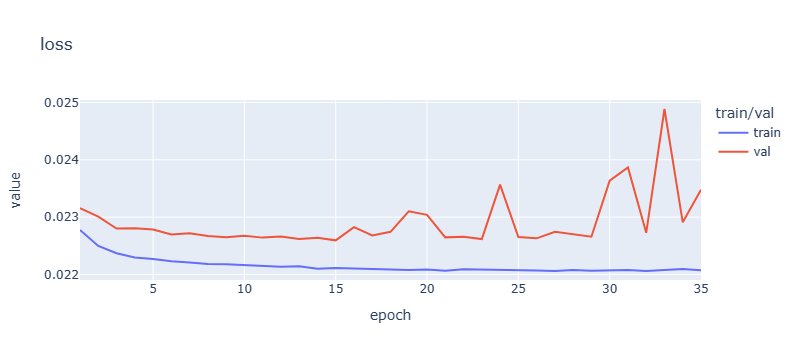

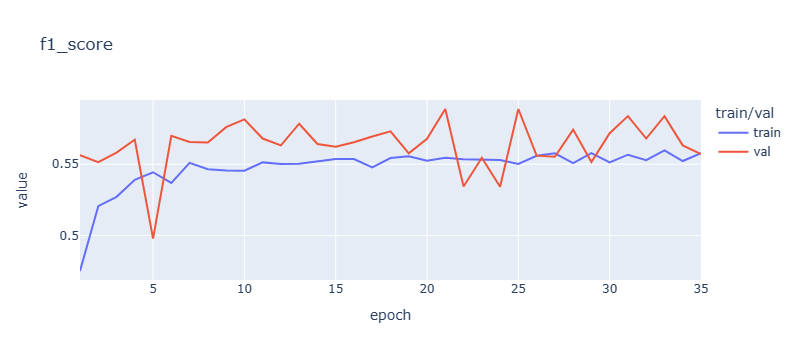

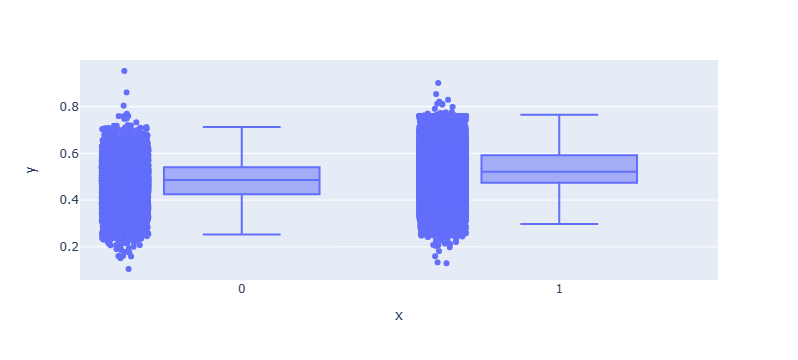

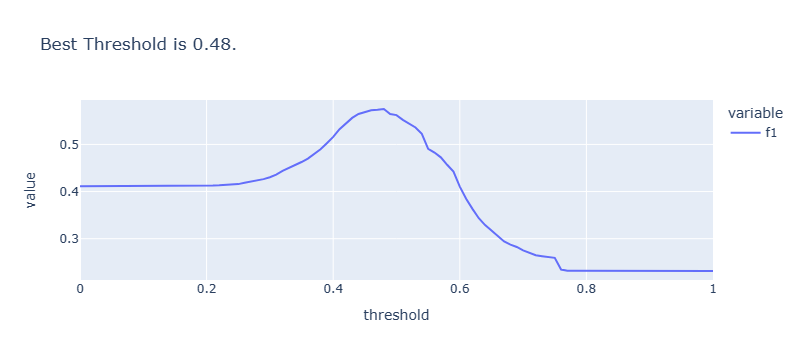

Epoch 1: loss_train 0.0227, f1_train 0.5688
Epoch 2: loss_train 0.0226, f1_train 0.5706
Epoch 3: loss_train 0.0226, f1_train 0.5675
Epoch 4: loss_train 0.0227, f1_train 0.5640
Epoch 5: loss_train 0.0227, f1_train 0.5620
Epoch 6: loss_train 0.0226, f1_train 0.5656
Epoch 7: loss_train 0.0226, f1_train 0.5665
Epoch 8: loss_train 0.0226, f1_train 0.5646
Epoch 9: loss_train 0.0227, f1_train 0.5590
Epoch 10: loss_train 0.0227, f1_train 0.5552
Epoch 11: loss_train 0.0227, f1_train 0.5512
Epoch 12: loss_train 0.0226, f1_train 0.5654
Epoch 13: loss_train 0.0226, f1_train 0.5658
Epoch 14: loss_train 0.0227, f1_train 0.5555
Epoch 15: loss_train 0.0227, f1_train 0.5624
Epoch 16: loss_train 0.0227, f1_train 0.5567
Epoch 17: loss_train 0.0226, f1_train 0.5682
Epoch 18: loss_train 0.0225, f1_train 0.5706
Epoch 19: loss_train 0.0226, f1_train 0.5642
Epoch 20: loss_train 0.0226, f1_train 0.5684


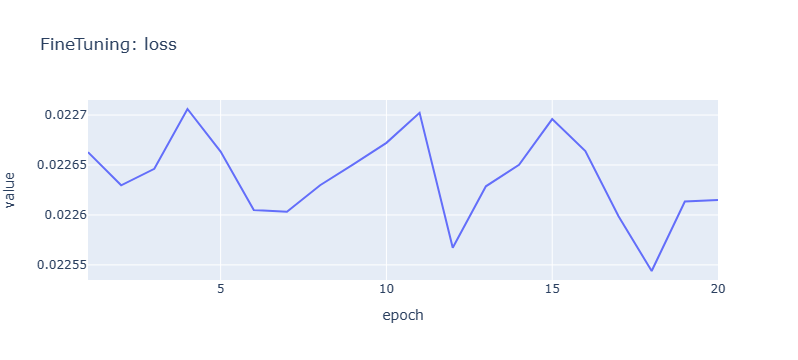

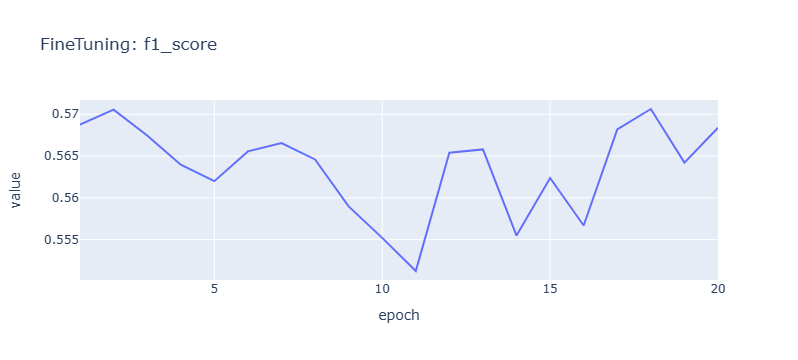


training level_group 5-12 model...
Epoch 1/100: loss_train 0.0225, loss_val 0.0225, f1_train 0.5346 f1_val - 0.6050
Epoch 2/100: loss_train 0.0220, loss_val 0.0222, f1_train 0.5639 f1_val - 0.6028
Epoch 3/100: loss_train 0.0219, loss_val 0.0222, f1_train 0.5728 f1_val - 0.6052
Epoch 4/100: loss_train 0.0219, loss_val 0.0222, f1_train 0.5759 f1_val - 0.6106
Epoch 5/100: loss_train 0.0218, loss_val 0.0222, f1_train 0.5763 f1_val - 0.5977
Epoch 6/100: loss_train 0.0218, loss_val 0.0222, f1_train 0.5745 f1_val - 0.5902
Epoch 7/100: loss_train 0.0218, loss_val 0.0223, f1_train 0.5797 f1_val - 0.6160
Epoch 8/100: loss_train 0.0217, loss_val 0.0221, f1_train 0.5832 f1_val - 0.6042
Epoch 9/100: loss_train 0.0217, loss_val 0.0221, f1_train 0.5815 f1_val - 0.5907
Epoch 10/100: loss_train 0.0217, loss_val 0.0222, f1_train 0.5800 f1_val - 0.5887
Epoch 11/100: loss_train 0.0217, loss_val 0.0221, f1_train 0.5843 f1_val - 0.5789
Epoch 12/100: loss_train 0.0217, loss_val 0.0221, f1_train 0.5842 f1_va

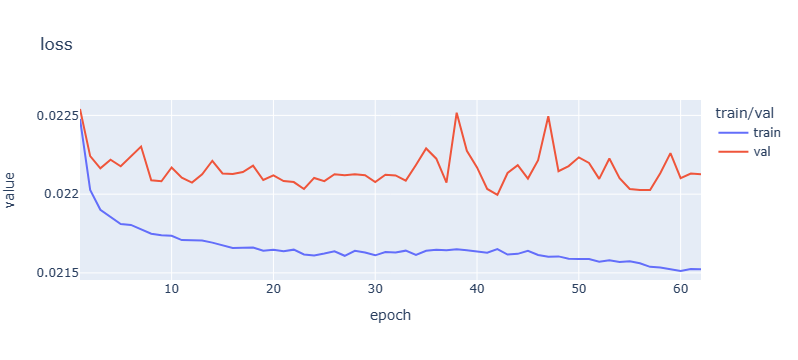

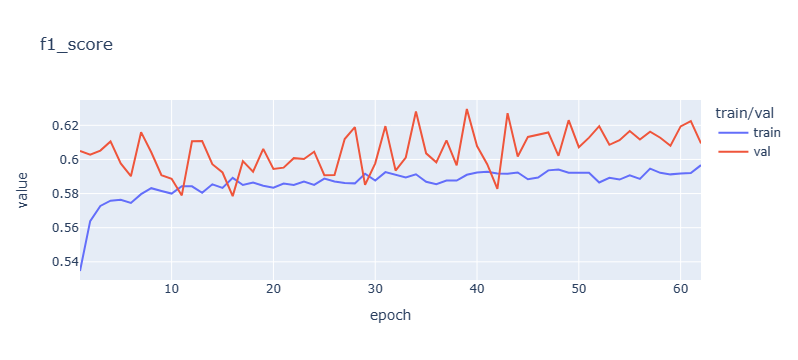

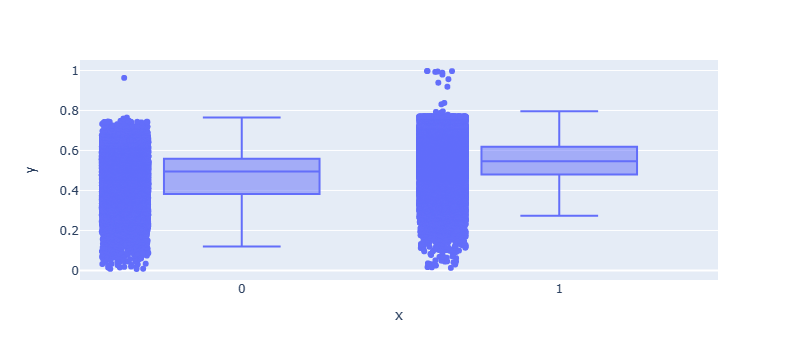

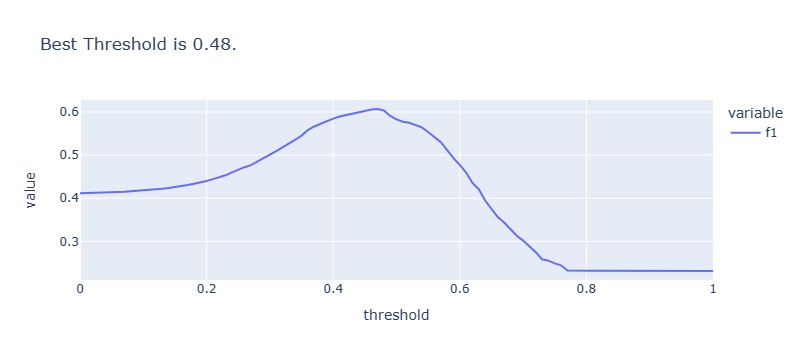

Epoch 1: loss_train 0.0222, f1_train 0.5952
Epoch 2: loss_train 0.0222, f1_train 0.5968
Epoch 3: loss_train 0.0222, f1_train 0.5988
Epoch 4: loss_train 0.0221, f1_train 0.6032
Epoch 5: loss_train 0.0222, f1_train 0.5985
Epoch 6: loss_train 0.0221, f1_train 0.6025
Epoch 7: loss_train 0.0221, f1_train 0.6110
Epoch 8: loss_train 0.0222, f1_train 0.6017
Epoch 9: loss_train 0.0221, f1_train 0.6052
Epoch 10: loss_train 0.0221, f1_train 0.6030
Epoch 11: loss_train 0.0221, f1_train 0.6076
Epoch 12: loss_train 0.0222, f1_train 0.6046
Epoch 13: loss_train 0.0221, f1_train 0.6062
Epoch 14: loss_train 0.0221, f1_train 0.6046
Epoch 15: loss_train 0.0220, f1_train 0.6044
Epoch 16: loss_train 0.0220, f1_train 0.6086
Epoch 17: loss_train 0.0221, f1_train 0.6056
Epoch 18: loss_train 0.0221, f1_train 0.6072
Epoch 19: loss_train 0.0220, f1_train 0.6063
Epoch 20: loss_train 0.0220, f1_train 0.6039


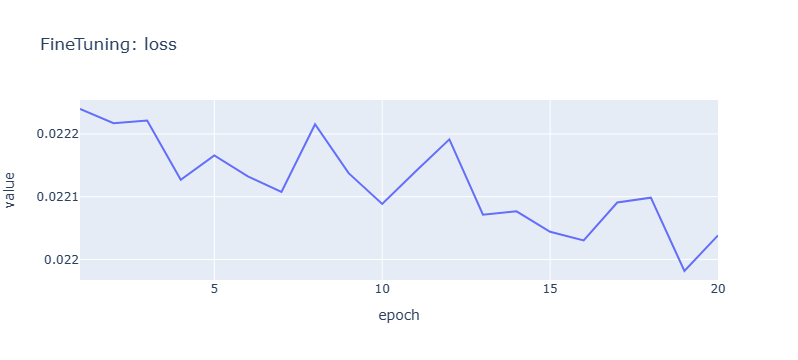

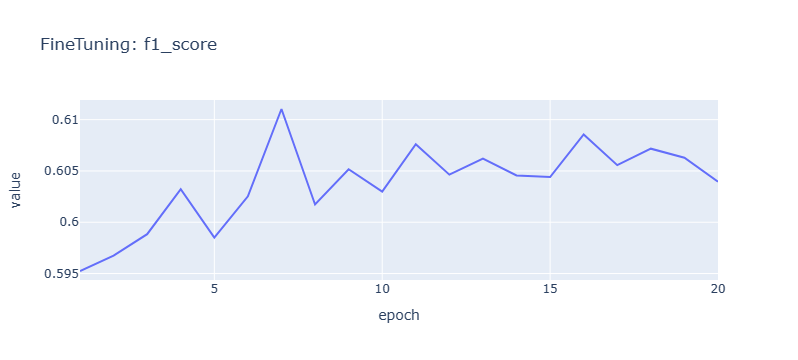


training level_group 13-22 model...
Epoch 1/100: loss_train 0.0223, loss_val 0.0222, f1_train 0.5468 f1_val - 0.5830
Epoch 2/100: loss_train 0.0218, loss_val 0.0220, f1_train 0.5782 f1_val - 0.5653
Epoch 3/100: loss_train 0.0217, loss_val 0.0221, f1_train 0.5850 f1_val - 0.6326
Epoch 4/100: loss_train 0.0216, loss_val 0.0220, f1_train 0.5940 f1_val - 0.5776
Epoch 5/100: loss_train 0.0216, loss_val 0.0219, f1_train 0.5904 f1_val - 0.5952
Epoch 6/100: loss_train 0.0215, loss_val 0.0219, f1_train 0.5957 f1_val - 0.5981
Epoch 7/100: loss_train 0.0215, loss_val 0.0219, f1_train 0.5945 f1_val - 0.6136
Epoch 8/100: loss_train 0.0215, loss_val 0.0219, f1_train 0.5961 f1_val - 0.5852
Epoch 9/100: loss_train 0.0215, loss_val 0.0219, f1_train 0.5913 f1_val - 0.6031
Epoch 10/100: loss_train 0.0214, loss_val 0.0218, f1_train 0.5945 f1_val - 0.6148
Epoch 11/100: loss_train 0.0214, loss_val 0.0219, f1_train 0.5936 f1_val - 0.6053
Epoch 12/100: loss_train 0.0214, loss_val 0.0218, f1_train 0.5958 f1_v

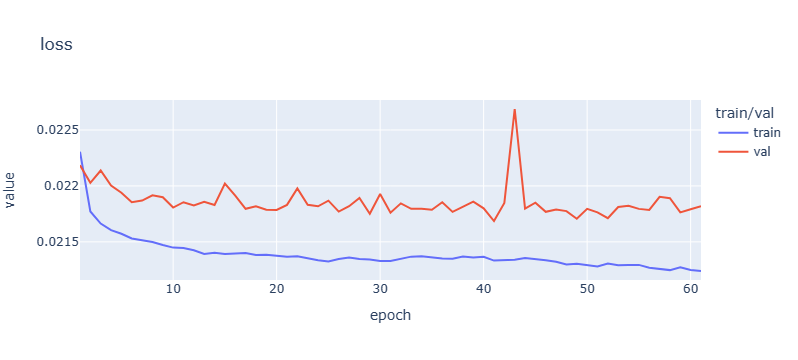

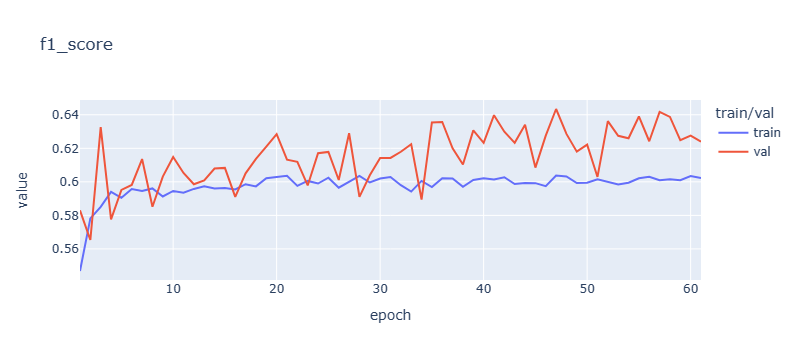

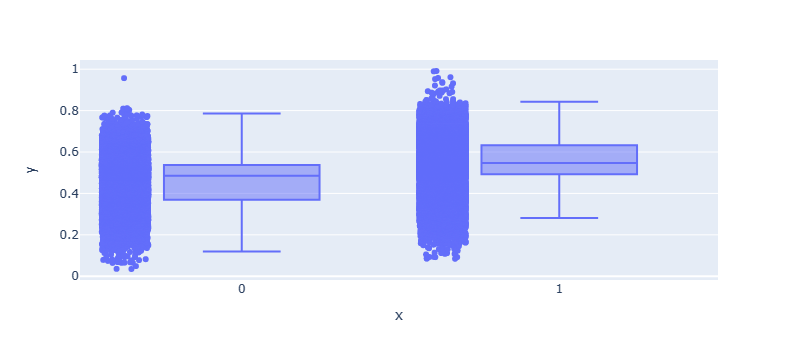

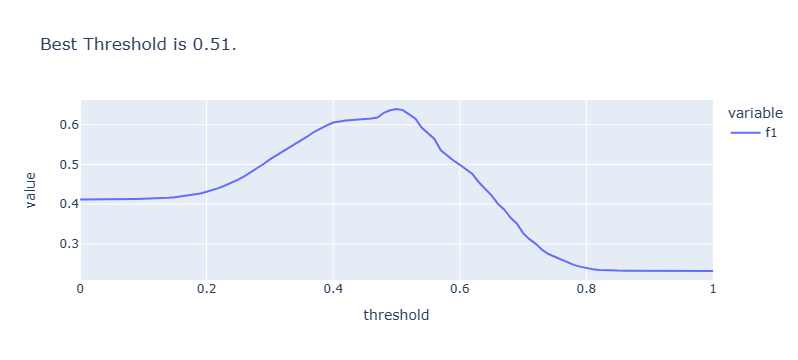

Epoch 1: loss_train 0.0219, f1_train 0.6122
Epoch 2: loss_train 0.0218, f1_train 0.6086
Epoch 3: loss_train 0.0218, f1_train 0.6091
Epoch 4: loss_train 0.0218, f1_train 0.6041
Epoch 5: loss_train 0.0218, f1_train 0.6099
Epoch 6: loss_train 0.0218, f1_train 0.6067
Epoch 7: loss_train 0.0218, f1_train 0.6006
Epoch 8: loss_train 0.0218, f1_train 0.6049
Epoch 9: loss_train 0.0218, f1_train 0.6047
Epoch 10: loss_train 0.0218, f1_train 0.6096
Epoch 11: loss_train 0.0219, f1_train 0.6041
Epoch 12: loss_train 0.0218, f1_train 0.5970
Epoch 13: loss_train 0.0217, f1_train 0.6000
Epoch 14: loss_train 0.0218, f1_train 0.5987
Epoch 15: loss_train 0.0218, f1_train 0.5989
Epoch 16: loss_train 0.0218, f1_train 0.5958
Epoch 17: loss_train 0.0217, f1_train 0.6052
Epoch 18: loss_train 0.0217, f1_train 0.6067
Epoch 19: loss_train 0.0217, f1_train 0.6005
Epoch 20: loss_train 0.0217, f1_train 0.6059


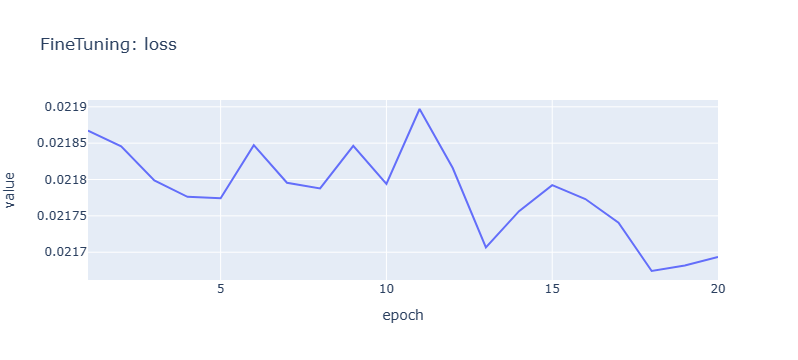

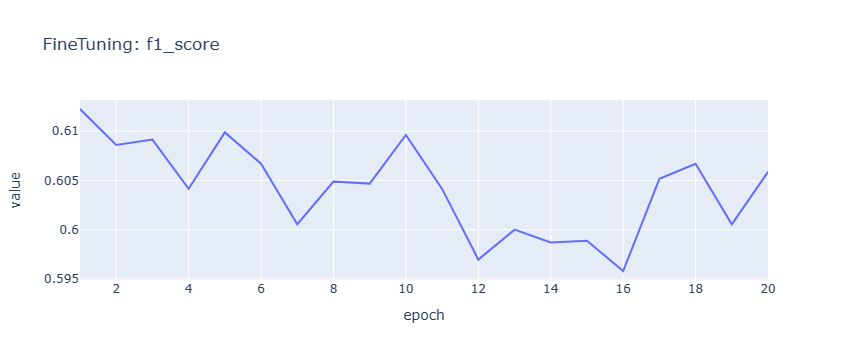

,session_id,correct
0,20090109393214576_q1,1
1,20090312143683264_q1,0
2,20090312331414616_q1,1
3,20090109393214576_q2,1
4,20090312143683264_q2,0
5,20090312331414616_q2,1
6,20090109393214576_q3,1
7,20090312143683264_q3,0
8,20090312331414616_q3,1
9,20090109393214576_q4,1


,session_id,correct
0,20090109393214576_q1,1
1,20090312143683264_q1,0
2,20090312331414616_q1,1
3,20090109393214576_q2,1
4,20090312143683264_q2,0
5,20090312331414616_q2,1
6,20090109393214576_q3,1
7,20090312143683264_q3,0
8,20090312331414616_q3,1
9,20090109393214576_q4,1


,session_id,correct
0,20090109393214576_q1,0
1,20090312143683264_q1,0
2,20090312331414616_q1,1
3,20090109393214576_q2,0
4,20090312143683264_q2,0
5,20090312331414616_q2,1
6,20090109393214576_q3,0
7,20090312143683264_q3,0
8,20090312331414616_q3,1
9,20090109393214576_q4,0


CPU times: user 1h 17min 14s, sys: 14.2 s, total: 1h 17min 28s
Wall time: 1h 17min 25s


In [12]:
%%time

if CFG.SUBMISSION_MODE:    
    env = jo_wilder.make_env()
    iter_test = env.iter_test()

    storage = []
    for x, sample in iter_test:
        level_group = x.level_group.values[0]
        if level_group == "0-4":
            storage.append(x)
            x = dp.transform(data=x, decided_level_group=level_group)
        elif level_group == "5-12":
            storage.append(x)
            x = pd.concat(storage, axis=0, ignore_index=True)
            x.level_group = level_group
            x = dp.transform(data=x, decided_level_group=level_group)
        else: # "13-22"
            x = pd.concat(storage + [x], axis=0, ignore_index=True)
            x.level_group = level_group
            x = dp.transform(data=x, decided_level_group=level_group)
            storage = []
        
        if CFG.MODEL_TYPE=="ensemble":
            submission = predict(x, models, level_group, thresholds[level_group])
        elif CFG.MODEL_TYPE=="multi":        
            submission = predict(x, models, level_group, thresholds[level_group])
        elif CFG.MODEL_TYPE=="single":            
            submission = []
            for q in lq_dict[level_group]:
                submission.append(predict(x, models, level_group, thresholds[q], q))
            submission = pd.concat(submission, axis=0)
        
        submission = submission.set_index("session_id").reindex(sample.session_id).reset_index()
        env.predict(submission)                       

else:
    models = {}
    thresholds = {}
    
    if CFG.MODEL_TYPE=="multi":
        if CFG.TRAINING_OMIT:
            for level_group in lq_dict.keys():
                model = MultiOutputsModel(
                    train[level_group].shape[1],
                    18 if CFG.PREDICT_ALL else len(lq_dict[level_group])
                ).to(CFG.DEVICE)
                checkpoint_path = f"{CFG.CHECKPOINT_PATH}/{model.name}_bestmodel{'_'+level_group if level_group else ''}{'_all' if CFG.PREDICT_ALL else ''}.pth"
                model.load_state_dict(torch.load(checkpoint_path))
                models[level_group] = model
                with open(f"{CFG.CHECKPOINT_PATH}/{model.name}_thresholds{'_all' if CFG.PREDICT_ALL else ''}.pickle", "rb") as f:
                    thresholds = pickle.load(f)
                    
        else:
            for level_group in lq_dict.keys():
                print(f"\ntraining level_group {level_group} model...")
                train_loader, val_loader = create_loader_train(
                    train[level_group],
                    train_labels,
                    level_group,
                    predict_all=CFG.PREDICT_ALL
                )
                model, best_threshold = training(train_loader, val_loader, MultiOutputsModel)
                models[level_group] = model
                thresholds[level_group] = best_threshold
                with open(f"{CFG.CHECKPOINT_PATH}/{model.name}_thresholds{'_all' if CFG.PREDICT_ALL else ''}.pickle", "wb") as f:
                    pickle.dump(thresholds, f)

        for level_group in lq_dict.keys():
            submission = predict(test[level_group], models, level_group, thresholds[level_group])
            display(submission)
            submission.to_csv("submission.csv", index=False)
            
    elif CFG.MODEL_TYPE=="single":
        if CFG.TRAINING_OMIT:
            for level_group in lq_dict.keys():
                for q in lq_dict[level_group]:
                    model = SingleOutputModel(train[level_group].shape[1]).to(CFG.DEVICE)
                    checkpoint_path = f"{CFG.CHECKPOINT_PATH}/{model.name}_bestmodel{'_'+q if q else ''}.pth"
                    model.load_state_dict(torch.load(checkpoint_path))
                    models[q] = model
                with open(f"{CFG.CHECKPOINT_PATH}/{model.name}_thresholds.pickle", "rb") as f:
                    thresholds = pickle.load(f)

        else:
            for level_group in lq_dict.keys():
                print(f"\ntraining level_group {level_group} models...")
                for q in lq_dict[level_group]:
                    print(f" training question {q} model...\n")
                    train_loader, val_loader = create_loader_train(
                        train[level_group], train_labels, level_group, q
                    )
                    model, best_threshold = training(train_loader, val_loader, SingleOutputModel, q)
                    models[q] = model
                    thresholds[q] = best_threshold
                    with open(f"{CFG.CHECKPOINT_PATH}/{model.name}_thresholds.pickle", "wb") as f:
                        pickle.dump(thresholds, f)

        for level_group in lq_dict.keys():
            submission = []
            for q in lq_dict[level_group]:
                submission.append(predict(test[level_group], models, level_group, thresholds[q], q))
            submission = pd.concat(submission, axis=0, ignore_index=True)
            display(submission)
            submission.to_csv("submission.csv", index=False)
            
    elif CFG.MODEL_TYPE=="ensemble":
        pretrained_models = {}
        for level_group in lq_dict.keys():
            model = MultiOutputsModel(train[level_group].shape[1], len(lq_dict[level_group])).to(CFG.DEVICE)
            checkpoint_path = f"{CFG.CHECKPOINT_PATH}/{model.name}_bestmodel{'_'+level_group if level_group else ''}.pth"
            model.load_state_dict(torch.load(checkpoint_path))
            for param in model.parameters():
                param.requires_grad = False
            pretrained_models[level_group] = model

            for q in lq_dict[level_group]:
                model = SingleOutputModel(train[level_group].shape[1]).to(CFG.DEVICE)
                checkpoint_path = f"{CFG.CHECKPOINT_PATH}/{model.name}_bestmodel{'_'+q if q else ''}.pth"
                model.load_state_dict(torch.load(checkpoint_path))
                for param in model.parameters():
                    param.requires_grad = False
                pretrained_models[q] = model
        
        for level_group in lq_dict.keys():
            train_loader, val_loader = create_loader_train(train[level_group], train_labels, level_group)
            for i, qn in enumerate(lq_dict[level_group]):

                q = pretrained_models[qn]
                level = pretrained_models[level_group]

                sys, mys, ts = [], [], []
                for x,t in train_loader:
                    x = x.to(CFG.DEVICE)
                    sys += q(x).view(-1).detach().cpu().tolist()
                    mys += level(x)[:, i].view(-1).detach().cpu().tolist()
                    ts += t[:,i].view(-1).tolist()

                for x,t in val_loader:
                    x = x.to(CFG.DEVICE)
                    sys += q(x).view(-1).detach().cpu().tolist()
                    mys += level(x)[:, i].view(-1).detach().cpu().tolist()
                    ts += t[:,i].view(-1).tolist()

                px.scatter(x=sys, y=mys, color=[str(t) for t in ts],
                           range_x=(0,1), range_y=(0,1), opacity=.7, title=qn).show()
        
        if CFG.TRAINING_OMIT:
            for level_group in lq_dict.keys():
                model = EnsembleModel(pretrained_models, level_group).to(CFG.DEVICE)
                checkpoint_path = f"{CFG.CHECKPOINT_PATH}/{model.name}_bestmodel{'_'+level_group if level_group else ''}.pth"
                model.load_state_dict(torch.load(checkpoint_path))
                models[level_group] = model
                with open(f"{CFG.CHECKPOINT_PATH}/{model.name}_thresholds.pickle", "rb") as f:
                    thresholds = pickle.load(f)
                    
        else:
            for level_group in lq_dict.keys():
                print(f"\ntraining level_group {level_group} model...")
                train_loader, val_loader = create_loader_train(train[level_group], train_labels, level_group)
                model, best_threshold = training(train_loader, val_loader, EnsembleModel, None, pretrained_models)
                models[level_group] = model
                thresholds[level_group] = best_threshold
                with open(f"{CFG.CHECKPOINT_PATH}/{model.name}_thresholds.pickle", "wb") as f:
                    pickle.dump(thresholds, f)

        for level_group in lq_dict.keys():
            submission = predict(test[level_group], models, level_group, thresholds[level_group])
            display(submission)
            submission.to_csv("submission.csv", index=False)    

## Checking Features

### LGB

In [13]:
lgb_models, lgb_preds, lgb_scores, fi_df = lgb_training(train, train_labels)
fi_df
lgb_scores

Training until validation scores don't improve for 100 rounds
[100]	training's binary_logloss: 0.0155896	valid_1's binary_logloss: 0.595893
Early stopping, best iteration is:
[22]	training's binary_logloss: 0.211434	valid_1's binary_logloss: 0.531631
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [

,q1,q2,q3,q4,q5,q6,q7,q8,q9,q10,q11,q12,q13,q14,q15,q16,q17,q18
elapsed_time_max,46.608719,113.973574,138.531871,34.811380,55.860809,159.072629,54.837240,12.701500,58.010121,153.880079,44.433610,0.000000,15.939600,59.752789,7.674510,0.000000,62.892599,127.684131
elapsed_time_mean,127.753370,30.250881,403.241033,69.761361,104.404160,48.236472,73.928631,10.936300,97.874059,43.641150,110.649300,0.000000,107.631099,99.400120,25.026320,0.000000,106.409498,140.707825
elapsed_time_median,215.535119,86.627243,736.960522,129.054321,48.670481,153.854999,192.012096,10.538000,60.094681,81.888050,129.382410,0.000000,146.896398,161.169390,83.373991,67.691998,90.668900,174.213784
elapsed_time_75percentile,141.000919,71.319671,10.228300,29.305700,33.859349,20.891360,99.912550,15.192900,81.236898,77.048852,74.542190,52.938599,0.000000,0.000000,9.844160,27.442400,22.414900,27.022020
elapsed_time_25percentile,236.931690,77.767399,131.490489,182.700779,179.827361,288.040725,321.678222,130.878638,302.345850,151.322759,92.310799,332.341610,65.339899,220.899004,108.617769,35.249298,61.468699,177.507644
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
hover_duration_max_diff_level18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,36.265241,29.361510,0.000000,0.000000,283.684862
hover_duration_max_diff_level19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,345.902421,251.421867,43.961201,91.847699,402.378135
hover_duration_max_diff_level20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,197.342970,101.049390,0.000000,70.953401,601.540051
hover_duration_max_diff_level21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,376.292059,166.111539,112.581600,54.377700,316.420265


{'q1': 0.6385151760206688,
 'q2': 0.49377147766323026,
 'q3': 0.5072473867595818,
 'q4': 0.6241703061489233,
 'q5': 0.629574390400673,
 'q6': 0.6161190599110062,
 'q7': 0.5864301923224775,
 'q8': 0.5232369453721641,
 'q9': 0.5926470810622804,
 'q10': 0.6133912374943847,
 'q11': 0.5689377157281954,
 'q12': 0.46322022318378503,
 'q13': 0.553708801266738,
 'q14': 0.5992016686128574,
 'q15': 0.6181503594387225,
 'q16': 0.42357544631939353,
 'q17': 0.40749120160884866,
 'q18': 0.5241689685904348}

In [ ]:
pd.options.display.max_rows=2000
fi_df.round(3).sort_index()

### Dimensionality Reduction

In [ ]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

lg="5-12"

pca = PCA(n_components=3, random_state=CFG.SEED)
train_pca = pca.fit_transform(train[lg])
train_pca

for q in lq_dict[lg]:
    px.scatter_3d(x=train_pca[:, 0], y=train_pca[:, 1], z=train_pca[:,2],
               color=train_labels[q].astype(str), opacity=.5,
               width=700, height=500, title=f"PCA: {q}")
    
tsne = TSNE(n_components=3, random_state=CFG.SEED)
train_tsne = tsne.fit_transform(train[lg])
train_tsne

for q in lq_dict[lg]:
    px.scatter_3d(x=train_tsne[:, 0], y=train_tsne[:, 1], z=train_tsne[:,2],
               color=train_labels[q].astype(str), opacity=.5,
               width=700, height=500, title=f"TSNE: {q}")